# <a id='toc1_'></a>[Preparatory work](#toc0_)

- [Please ensure that you are running the following code using Python 3.8.18. Additionally, verify that all required libraries have been properly installed.](#toc1_1_1_)    

**Table of contents**<a id='toc0_'></a>    
- [Preparatory work](#toc1_)    
- [SGP](#toc2_)    
  - [Model](#toc2_1_)    
  - [Bayesian optimization](#toc2_2_)    
  - [Load the best parameters directly](#toc2_3_)    
    - [If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc2_3_1_)    
  - [Data visualization](#toc2_4_)    
  - [SHAP for SGP](#toc2_5_)    
- [ENA](#toc3_)    
  - [Model](#toc3_1_)    
  - [Load the best parameters directly](#toc3_2_)    
    - [If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc3_2_1_)    
  - [Data visualization](#toc3_3_)    
  - [SHAP for ENA](#toc3_4_)    
- [ASI](#toc4_)    
  - [Model](#toc4_1_)    
  - [Load the best parameters directly](#toc4_2_)    
    - [If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc4_2_1_)    
  - [Data visualization](#toc4_3_)    
  - [SHAP for ASI](#toc4_4_)    
- [GUC](#toc5_)    
  - [Model](#toc5_1_)    
  - [Load the best parameters directly](#toc5_2_)    
    - [If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc5_2_1_)    
  - [Data visualization](#toc5_3_)    
  - [SHAP for GUC](#toc5_4_)    
- [Contribution](#toc6_)    
  - [Make sure that the contribution rates of the four sites have been calculated when running this section](#toc6_1_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import shap
import matplotlib.pyplot as plt
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.datasets import make_regression
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
from scipy.stats import gaussian_kde
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from numpy import mean
from scipy.stats import linregress
from matplotlib.ticker import FormatStrFormatter,MaxNLocator,MultipleLocator
from matplotlib import ticker
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_absolute_percentage_error

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


# <a id='toc2_'></a>[SGP](#toc0_)
## <a id='toc2_1_'></a>[Model](#toc0_)

In [2]:
# data_sgp reading
data_sgp = pd.read_csv(r'E:/aabc\myDeepTree\data-250415/ba_qc/sgp.csv')
data_sgp = data_sgp.replace(-9999, float('nan'))
data_sgp.iloc[:, 0] = pd.to_numeric(data_sgp.iloc[:, 0], errors='coerce')
data_sgp = data_sgp.dropna()
data_sgp.columns = [
    'CCN','BS_B', 'BS_G', 'BS_R', 'AE_BG', 'AE_BR', 'AE_GR', 'BBS_B', 'BBS_G', 'BBS_R',
    'BSF_B', 'BSF_G', 'BSF_R',  'SSA_B', 'SSA_G', 'SSA_R', 
      'BA_B', 'BA_G', 'BA_R'
]
data_sgp

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,994.422311,36.315190,27.969503,18.052286,1.991714,2.103956,2.197353,3.773548,3.464851,2.792726,0.103911,0.123880,0.154702,0.945319,0.940363,0.927178,2.100619,1.773787,1.417845
1,989.845493,34.604317,26.661331,17.208166,1.988988,2.103031,2.197925,4.021618,3.626426,2.454104,0.116217,0.136018,0.142613,0.945298,0.940014,0.925638,2.002482,1.701350,1.382432
2,912.411032,33.845818,25.782219,16.443419,2.075684,2.170882,2.250096,4.046744,3.500269,2.754570,0.119564,0.135763,0.167518,0.944765,0.939673,0.923352,1.978768,1.655214,1.364971
3,878.517933,33.509308,25.435738,16.426088,2.102668,2.138113,2.167607,3.899488,3.452181,2.591593,0.116370,0.135722,0.157773,0.942546,0.937432,0.923040,2.042605,1.697675,1.369560
4,844.085035,32.986706,24.905092,15.399483,2.143586,2.296041,2.422899,3.651942,2.967232,2.461858,0.110710,0.119142,0.159866,0.934295,0.928041,0.907154,2.319807,1.931104,1.576125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519370,1208.105222,16.518955,13.191820,8.967399,1.715521,1.841741,1.946768,2.097123,2.088540,1.851044,0.126953,0.158321,0.206419,0.867610,0.869039,0.850901,2.520662,1.987958,1.571312
519371,1223.546427,16.527730,12.643555,8.999412,2.043357,1.794988,1.588321,2.775113,2.213680,1.122937,0.167906,0.175084,0.124779,0.870512,0.865075,0.863907,2.458479,1.971996,1.417696
519372,1208.973615,17.065367,13.013078,8.050191,2.067798,2.269847,2.437971,2.870734,2.225497,1.571510,0.168220,0.171020,0.195214,0.875343,0.869308,0.836116,2.430267,1.956392,1.577886
519373,1186.972453,16.179010,12.165983,6.991109,2.174389,2.549926,2.862409,2.203812,1.868653,1.517139,0.136214,0.153597,0.217010,0.874024,0.867684,0.827721,2.331940,1.855233,1.455110


In [3]:
data_sgp = data_sgp[data_sgp['CCN'] >0]
data_sgp = data_sgp[data_sgp['AE_BG'] >0]
data_sgp = data_sgp[data_sgp['AE_BR'] >0]
data_sgp = data_sgp[data_sgp['AE_GR'] >0]
data_sgp = data_sgp[data_sgp['BA_B'] >0]
data_sgp = data_sgp[data_sgp['BA_G'] >0]
data_sgp = data_sgp[data_sgp['BA_R'] >0]
data_sgp = data_sgp[data_sgp['BS_B'] >0]
data_sgp = data_sgp[data_sgp['BS_G'] >0]
data_sgp = data_sgp[data_sgp['BS_R'] >0]
data_sgp = data_sgp[data_sgp['BBS_B'] >0]
data_sgp = data_sgp[data_sgp['BBS_G'] >0]
data_sgp = data_sgp[data_sgp['BBS_R'] >0]
data_sgp = data_sgp[data_sgp['BSF_B'] >0]
data_sgp = data_sgp[data_sgp['BSF_G'] >0]   
data_sgp = data_sgp[data_sgp['BSF_R'] >0]
data_sgp = data_sgp[data_sgp['SSA_B'] <1]
data_sgp = data_sgp[data_sgp['SSA_G'] <1]
data_sgp = data_sgp[data_sgp['SSA_R'] <1]
data_sgp = data_sgp[data_sgp['SSA_B'] >0]
data_sgp = data_sgp[data_sgp['SSA_G'] >0]
data_sgp = data_sgp[data_sgp['SSA_R'] >0]
def remove_outliers(df):
    # Remove outliers using the 3-sigma rule
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        cutoff = std * 3
        lower = mean - cutoff
        upper = mean + cutoff
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Apply function to remove outliers
data_sgp = remove_outliers(data_sgp)
data_sgp


,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,994.422311,36.315190,27.969503,18.052286,1.991714,2.103956,2.197353,3.773548,3.464851,2.792726,0.103911,0.123880,0.154702,0.945319,0.940363,0.927178,2.100619,1.773787,1.417845
1,989.845493,34.604317,26.661331,17.208166,1.988988,2.103031,2.197925,4.021618,3.626426,2.454104,0.116217,0.136018,0.142613,0.945298,0.940014,0.925638,2.002482,1.701350,1.382432
2,912.411032,33.845818,25.782219,16.443419,2.075684,2.170882,2.250096,4.046744,3.500269,2.754570,0.119564,0.135763,0.167518,0.944765,0.939673,0.923352,1.978768,1.655214,1.364971
3,878.517933,33.509308,25.435738,16.426088,2.102668,2.138113,2.167607,3.899488,3.452181,2.591593,0.116370,0.135722,0.157773,0.942546,0.937432,0.923040,2.042605,1.697675,1.369560
4,844.085035,32.986706,24.905092,15.399483,2.143586,2.296041,2.422899,3.651942,2.967232,2.461858,0.110710,0.119142,0.159866,0.934295,0.928041,0.907154,2.319807,1.931104,1.576125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519370,1208.105222,16.518955,13.191820,8.967399,1.715521,1.841741,1.946768,2.097123,2.088540,1.851044,0.126953,0.158321,0.206419,0.867610,0.869039,0.850901,2.520662,1.987958,1.571312
519371,1223.546427,16.527730,12.643555,8.999412,2.043357,1.794988,1.588321,2.775113,2.213680,1.122937,0.167906,0.175084,0.124779,0.870512,0.865075,0.863907,2.458479,1.971996,1.417696
519372,1208.973615,17.065367,13.013078,8.050191,2.067798,2.269847,2.437971,2.870734,2.225497,1.571510,0.168220,0.171020,0.195214,0.875343,0.869308,0.836116,2.430267,1.956392,1.577886
519373,1186.972453,16.179010,12.165983,6.991109,2.174389,2.549926,2.862409,2.203812,1.868653,1.517139,0.136214,0.153597,0.217010,0.874024,0.867684,0.827721,2.331940,1.855233,1.455110


In [4]:
# data_sgp = data_sgp[data_sgp['CCN'] >0]
# data_sgp = data_sgp[data_sgp['SSA_B']<1]
# data_sgp = data_sgp[data_sgp['SSA_G']<1]
# data_sgp = data_sgp[data_sgp['SSA_R']<1]
# data_sgp = data_sgp[data_sgp['BA_B']>0]
# data_sgp = data_sgp[data_sgp['BA_G']>0]
# data_sgp = data_sgp[data_sgp['BA_R']>0]
# Prepare features and target variable
X = data_sgp.drop('CCN', axis=1)  # Features
y = data_sgp['CCN']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2024)
data_sgp

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,994.422311,36.315190,27.969503,18.052286,1.991714,2.103956,2.197353,3.773548,3.464851,2.792726,0.103911,0.123880,0.154702,0.945319,0.940363,0.927178,2.100619,1.773787,1.417845
1,989.845493,34.604317,26.661331,17.208166,1.988988,2.103031,2.197925,4.021618,3.626426,2.454104,0.116217,0.136018,0.142613,0.945298,0.940014,0.925638,2.002482,1.701350,1.382432
2,912.411032,33.845818,25.782219,16.443419,2.075684,2.170882,2.250096,4.046744,3.500269,2.754570,0.119564,0.135763,0.167518,0.944765,0.939673,0.923352,1.978768,1.655214,1.364971
3,878.517933,33.509308,25.435738,16.426088,2.102668,2.138113,2.167607,3.899488,3.452181,2.591593,0.116370,0.135722,0.157773,0.942546,0.937432,0.923040,2.042605,1.697675,1.369560
4,844.085035,32.986706,24.905092,15.399483,2.143586,2.296041,2.422899,3.651942,2.967232,2.461858,0.110710,0.119142,0.159866,0.934295,0.928041,0.907154,2.319807,1.931104,1.576125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519370,1208.105222,16.518955,13.191820,8.967399,1.715521,1.841741,1.946768,2.097123,2.088540,1.851044,0.126953,0.158321,0.206419,0.867610,0.869039,0.850901,2.520662,1.987958,1.571312
519371,1223.546427,16.527730,12.643555,8.999412,2.043357,1.794988,1.588321,2.775113,2.213680,1.122937,0.167906,0.175084,0.124779,0.870512,0.865075,0.863907,2.458479,1.971996,1.417696
519372,1208.973615,17.065367,13.013078,8.050191,2.067798,2.269847,2.437971,2.870734,2.225497,1.571510,0.168220,0.171020,0.195214,0.875343,0.869308,0.836116,2.430267,1.956392,1.577886
519373,1186.972453,16.179010,12.165983,6.991109,2.174389,2.549926,2.862409,2.203812,1.868653,1.517139,0.136214,0.153597,0.217010,0.874024,0.867684,0.827721,2.331940,1.855233,1.455110


## <a id='toc2_2_'></a>[Bayesian optimization](#toc0_)

In [39]:


xgb_params = {
    'n_estimators': Integer(50, 1000),
    'max_depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'subsample': Real(0.5, 1.0),
    'colsample_bytree': Real(0.5, 1.0),
    'random_state': Categorical([2024]),  
    # 'tree_method': Categorical(['gpu_hist']) 
}



rf_params = {
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(3, 16),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 6),
    'random_state': Categorical([2024])  
}


cb_params = {
    'iterations': Integer(50, 1000),
    'depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'l2_leaf_reg': Real(0.05, 10, prior='log-uniform'),
    'random_state': Categorical([2024]),  
    # 'task_type': Categorical(['GPU']), 
    # 'devices': Categorical(['0:1']),
    'train_dir': Categorical(["./catboost_info"])  
}


opt_xgb = BayesSearchCV(XGBRegressor(), xgb_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_rf = BayesSearchCV(RandomForestRegressor(), rf_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_cb = BayesSearchCV(CatBoostRegressor(verbose=0), cb_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)

opt_xgb.fit(X_train, y_train)
opt_rf.fit(X_train, y_train)
opt_cb.fit(X_train, y_train)

print("Best XGBoost params:", opt_xgb.best_params_)
print("Best RF params:", opt_rf.best_params_)
print("Best CatBoost params:", opt_cb.best_params_)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

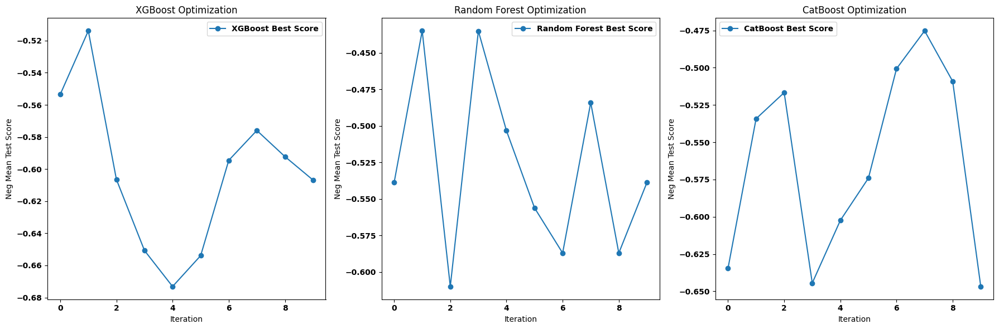

In [ ]:
from sklearn.ensemble import VotingRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Plot Bayesian optimization process
def plot_optimization_results(opt, model_name):
    results = opt.cv_results_
    best_scores = -np.array(results['mean_test_score'])
    plt.plot(best_scores, marker='o', label=f'{model_name} Best Score')
    plt.xlabel('Iteration')
    plt.ylabel('Neg Mean Test Score')
    plt.title(f'{model_name} Optimization')
    plt.legend()

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plot_optimization_results(opt_xgb, "XGBoost")
plt.subplot(1, 3, 2)
plot_optimization_results(opt_rf, "Random Forest")
plt.subplot(1, 3, 3)
plot_optimization_results(opt_cb, "CatBoost")
plt.tight_layout()
plt.show()

# # Create models with best parameters
# xgb_best_sgp = XGBRegressor(**opt_xgb_sgp.best_params_, n_jobs=-1)
# rf_best_sgp = RandomForestRegressor(**opt_rf_sgp.best_params_, n_jobs=-1)
# cb_best_sgp = CatBoostRegressor(**opt_cb_sgp.best_params_, verbose=0)

# # Create ensemble model
# ensemble_model_sgp = VotingRegressor(estimators=[
#     ('xgb', xgb_best_sgp),
#     ('rf', rf_best_sgp),
#     ('cb', cb_best_sgp)
# ])

# # Train ensemble model
# ensemble_model_sgp.fit(X_train_sgp, y_train_sgp)

# # Make predictions
# predictions_sgp = ensemble_model_sgp.predict(X_test_sgp)

# # Evaluate model
# mse_sgp = mean_squared_error(y_test_sgp, predictions_sgp)
# print(f'Mean Squared Error: {mse_sgp}')


In [41]:
np.save(r'E:/aabc/myDeepTree/data-250311/sgpxgb2.npy', opt_xgb.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250311/sgprf2.npy', opt_rf.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250311/sgpcb2.npy',opt_cb.best_params_)

## <a id='toc2_3_'></a>[Load the best parameters directly](#toc0_)
### <a id='toc2_3_1_'></a>[If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc0_)

In [311]:
# If you want to reproduce the work of the paper, please use the following parameter file or use the attached parameters
opt_xgb_best_params = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/sgp/sgpxgb.npy', allow_pickle=True).item()
opt_rf_best_params = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/sgp/sgprf.npy', allow_pickle=True).item()
opt_cb_best_params = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/sgp/sgpcb.npy', allow_pickle=True).item()
print(opt_xgb_best_params,opt_rf_best_params,opt_cb_best_params)

OrderedDict([('colsample_bytree', 0.9140093801238748), ('learning_rate', 0.040282097286786736), ('max_depth', 15), ('n_estimators', 457), ('subsample', 0.9936856716267677)]) OrderedDict([('max_depth', 16), ('min_samples_leaf', 3), ('min_samples_split', 2), ('n_estimators', 161)]) OrderedDict([('depth', 11), ('iterations', 804), ('l2_leaf_reg', 0.6095695747616849), ('learning_rate', 0.13318786567135893), ('train_dir', './catboost_info')])


In [143]:
# Use optimal parameters
xgb_best = XGBRegressor(**opt_xgb_best_params, n_jobs=-1)
rf_best = RandomForestRegressor(**opt_rf_best_params, n_jobs=-1)
# xgb_best = XGBRegressor(**opt_xgb_best_params)
# rf_best = RandomForestRegressor(**opt_rf_best_params)
cb_best = CatBoostRegressor(**opt_cb_best_params, verbose=0)

# Create an integration model
ensemble_model = VotingRegressor(estimators=[
    ('xgb', xgb_best),
    ('rf', rf_best),
    ('cb', cb_best)
])

ensemble_model.fit(X_train, y_train)

predictions = ensemble_model.predict(X_test)
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')


Mean Squared Error: 85991.8703670863


In [19]:
import joblib

model_filename = 'E:/aabc\myDeepTree\data-240806/ensemble_model_sgp.pkl'
joblib.dump(ensemble_model, model_filename)

print(f'Model saved to {model_filename}')


Model saved to E:/aabc\myDeepTree\data-240806/ensemble_model_sgp.pkl


## <a id='toc2_4_'></a>[Data visualization](#toc0_)

FixedFormatter should only be used together with FixedLocator


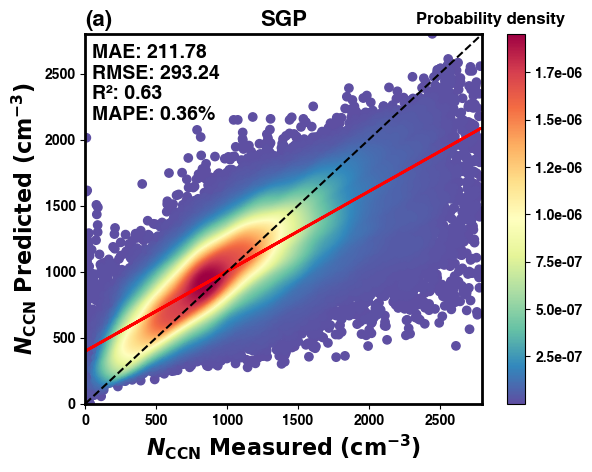

In [144]:

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica'] 
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


x = y_test.to_numpy()
y = predictions

fig = plt.figure()
ax = fig.add_subplot(111)

ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

density_scatter(x=x, y=y, ax=ax, is_cbar=True)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

regression_line = slope * x + intercept
plt.plot(x, regression_line, 'red', lw=2)

plt.plot([0, 2800], [0, 2800], 'black', lw=1.5, linestyle='--')  # 1:1
plt.axis([0, 2800, 0, 2800])

ax.tick_params(axis='both', labelsize=14)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(500))
ax.yaxis.set_major_locator(MultipleLocator(500))
BIAS_sgp = mean(x - y)
MSE_sgp = mean_squared_error(x, y)
RMSE_sgp = np.power(MSE_sgp, 0.5)
R2_sgp = r2_score(x, y)
MAE_sgp = mean_absolute_error(x, y)
EV_sgp = explained_variance_score(x, y)
MAPE_sgp = mean_absolute_percentage_error(x, y)
# text = f'\nMAE: {MAE:.2f}\nRMSE: {RMSE:.3f}\nR²: {R2:.3f}\nMAPE: {MAPE:.3f}%'
text = f'\nMAE: {MAE_sgp:.2f}\nRMSE: {RMSE_sgp:.2f}\nR²: {R2_sgp:.2f}\nMAPE: {MAPE_sgp:.2f}%'
plt.yticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(a)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('SGP', fontsize=16, fontname='Helvetica', fontweight='bold')
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.text(50,2150, text, fontsize=14, fontname='Helvetica')
plt.savefig('E:/aabc/summary/fig-250416/sgp.png',dpi=300,bbox_inches='tight',pad_inches=0)

plt.show()


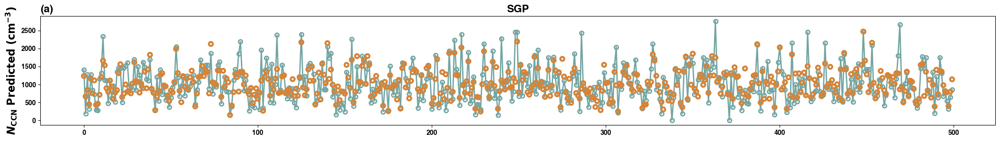

In [145]:

plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'
plt.figure(figsize=(26, 3))

plt.scatter(range(len(predictions))[0:500], predictions[0:500], label='Predicted Values', marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
plt.plot(range(len(y_test))[0:500], y_test[0:500],color='#73a5a2', label='True Values', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2,linewidth=2, zorder=1)
plt.title('SGP', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(a)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.xlabel('Sample Index')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.legend()
# plt.grid(True)
plt.savefig('E:/aabc/summary/fig-250416/sgp-line.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()

## <a id='toc2_5_'></a>[SHAP for SGP](#toc0_)

In [146]:
# SHAP interactions are based on the xgboost model
xgb_model = XGBRegressor(**opt_xgb_best_params, n_jobs=-1)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)

In [5]:
# Randomly select 3000 samples for SHAP analysis
np.random.seed(2024)
indices = np.random.choice(X_test.shape[0], 3000, replace=False)
# selected_X_test = X_test  # Comment this out if using the random subset
selected_X_test = X_test.iloc[indices]

In [148]:
# Create an explainer
explainer = shap.TreeExplainer(xgb_model)
# Compute SHAP interaction values
shap_interaction_values = explainer.shap_interaction_values(selected_X_test)


In [149]:
# np.save('E:/aabc/myDeepTree/data-240806/sgpshap_values.npy', shap_values_sgp)
np.save(r'E:\aabc\myDeepTree\data-250415/ba_qc/sgpshap_interaction_values.npy', shap_interaction_values)


In [150]:
# shap
explainer = shap.KernelExplainer(ensemble_model.predict, data=X_train.sample(100))
shap_values = explainer.shap_values(X_test.iloc[indices])


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 0/3000 [00:00<?, ?it/s]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 1/3000 [00:02<2:22:18,  2.85s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 2/3000 [00:05<2:20:11,  2.81s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 3/3000 [00:08<2:19:13,  2.79s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was

In [151]:
np.save('E:/aabc/myDeepTree/data-250415/ba_qc/sgpshap_values.npy', shap_values)

In [6]:
shap_values_guc = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/guc/gucshap_values.npy')
shap_interaction_values_guc = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/guc/gucshap_interaction_values.npy')
shap_values = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/sgp//sgpshap_values.npy')
shap_interaction_values = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/sgp/sgpshap_interaction_values.npy')
shap_values_asi = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/asi/asishap_values.npy')
shap_interaction_values_asi = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/asi/asishap_interaction_values.npy')
shap_values_ena = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/ena/enashap_values.npy')
shap_interaction_values_ena = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/ena/enashap_interaction_values.npy')
shap_values_mos = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/mos/mosshap_values.npy')
shap_interaction_values_mos = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/mos/mosshap_interaction_values.npy')

In [7]:
feature_names = [
    r'$\sigma_{sp}$_B',   #  BS_B
    r'$\sigma_{sp}$_G',   #  BS_G
    r'$\sigma_{sp}$_R',   #  BS_R
    'AE_BG',              
    'AE_BR',
    'AE_GR',
    r'$\sigma_{bsp}$_B',  #  BBS_B
    r'$\sigma_{bsp}$_G',  #  BBS_G
    r'$\sigma_{bsp}$_R',  #  BBS_R
    'BSF_B',             
    'BSF_G',
    'BSF_R',
    'SSA_B',
    'SSA_G',
    'SSA_R',
    r'$\sigma_{ap}$_B',   #  BA_B
    r'$\sigma_{ap}$_G',   #  BA_G
    r'$\sigma_{ap}$_R',   #  BA_R
]

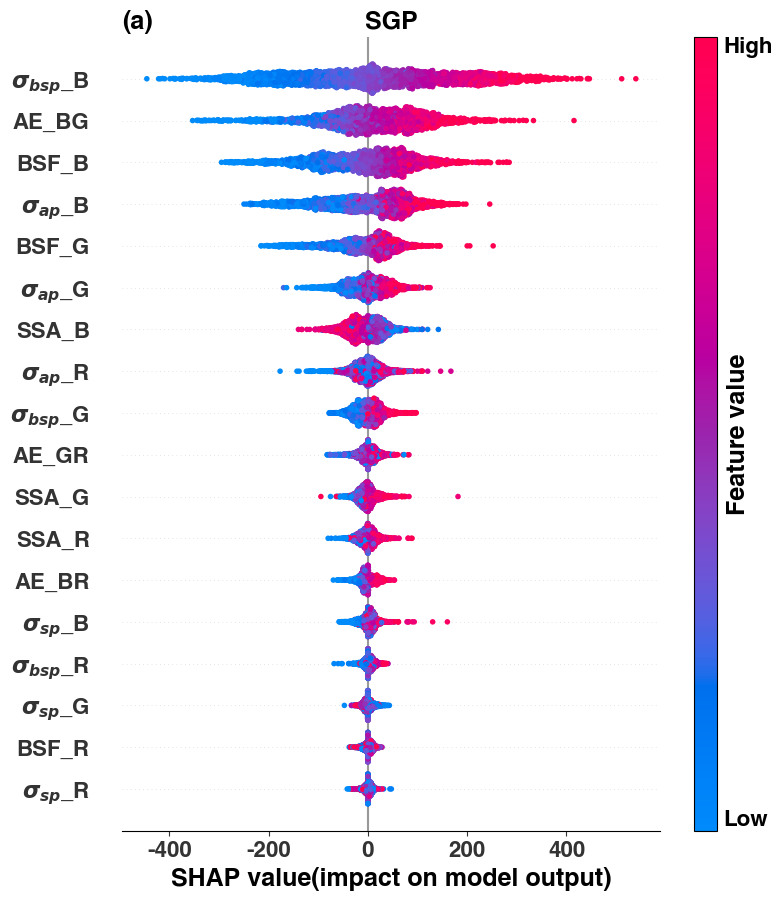

In [8]:
# summary
import os
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'

shap.summary_plot(shap_values, selected_X_test,feature_names=feature_names, show=False,color_bar=False)
cbar = plt.colorbar(aspect=35)
cbar.set_label('Feature value',size=18,fontname='Helvetica', fontweight='bold')
cbar.ax.set_yticklabels([])
cbar.ax.tick_params(axis='y', which='both', length=0)
cbar.ax.text(1.3,0,'Low',va='bottom',ha='left',transform=cbar.ax.transAxes,fontsize=16)
cbar.ax.text(1.3,1,'High',va='top',ha='left',transform=cbar.ax.transAxes,fontsize=16)

plt.xlabel('SHAP value(impact on model output)',fontsize=18,fontname='Helvetica', fontweight='bold')
plt.tick_params(axis='x',labelsize=16)
plt.tick_params(axis='y',labelsize=16)
plt.title('(a)', loc='left', fontsize=18, fontname='Helvetica', fontweight='bold')
plt.title('SGP', fontsize=18, fontname='Helvetica', fontweight='bold')
# plt.savefig('E:/aabc/summary/fig-250416/shap-sgp.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


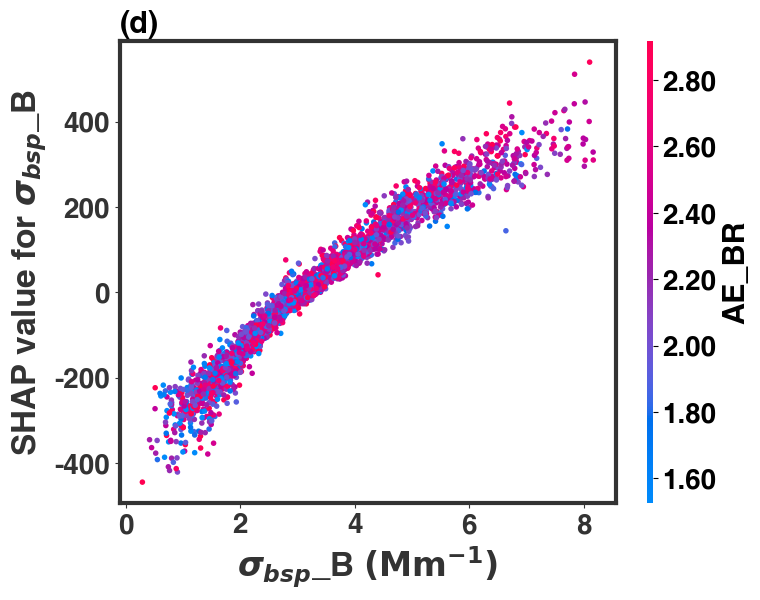

In [202]:
from matplotlib.ticker import FuncFormatter
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values, selected_X_test, interaction_index='AE_BR', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.set_title('(d)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
plt.savefig('E:/aabc/summary/fig-250416/sgp11.png',dpi=300,bbox_inches='tight',pad_inches=0)

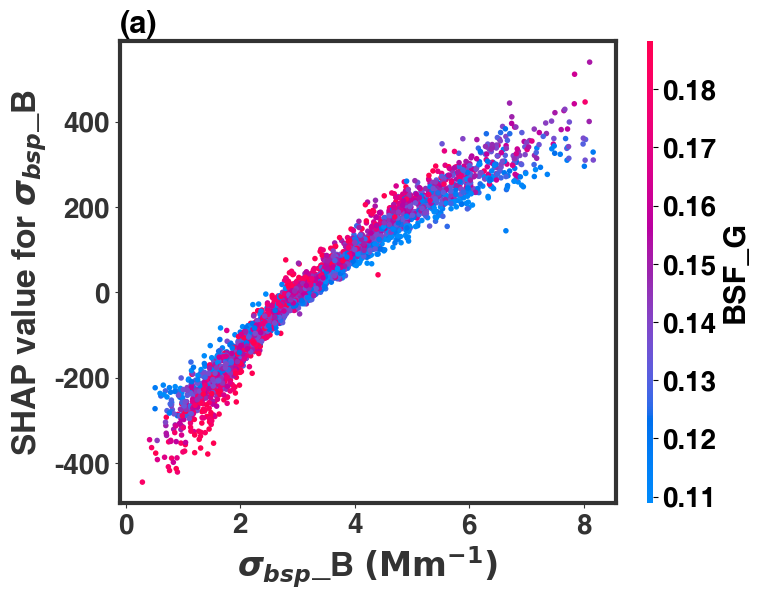

In [282]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values, selected_X_test, interaction_index='BSF_G', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(a)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/sgp1.png',dpi=300,bbox_inches='tight',pad_inches=0)

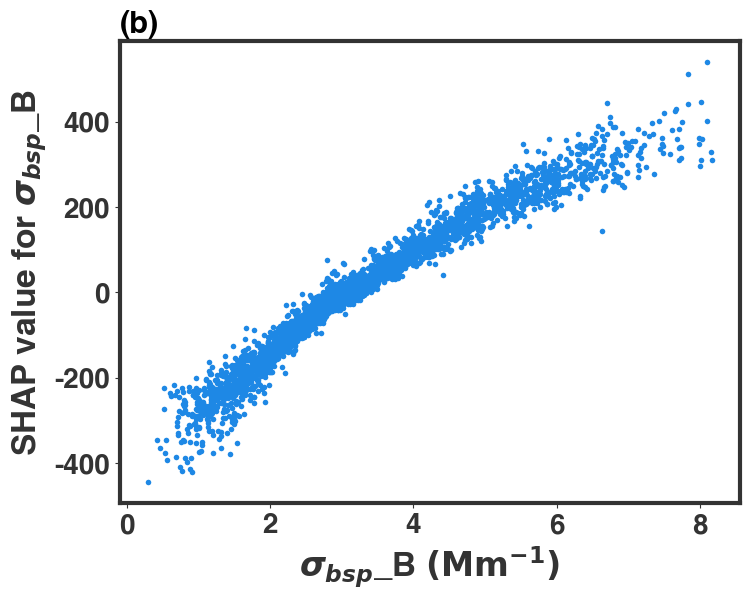

In [205]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values, selected_X_test, interaction_index=None, ax=ax, show=False)
# dependence

# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=20) 
# cbar.set_label('AE_BG', fontsize=24) 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(b)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/sgp22.png',dpi=300,bbox_inches='tight',pad_inches=0)

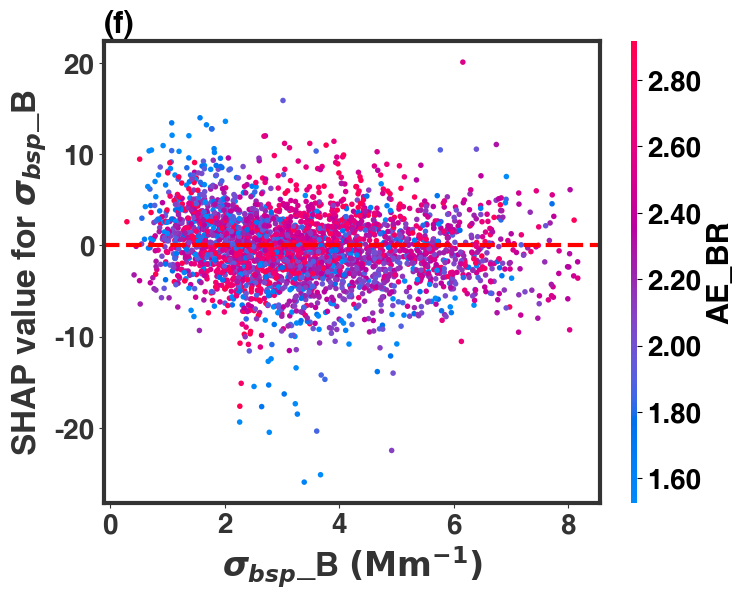

In [206]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BBS_B",  # key feature
    shap_interaction_values[:, :, selected_X_test.columns.get_loc("AE_BR")],  
    selected_X_test,
    interaction_index="AE_BR",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(f)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
# ax.set_title('(b)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
plt.savefig('E:/aabc/summary/fig-250416/sgp33.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


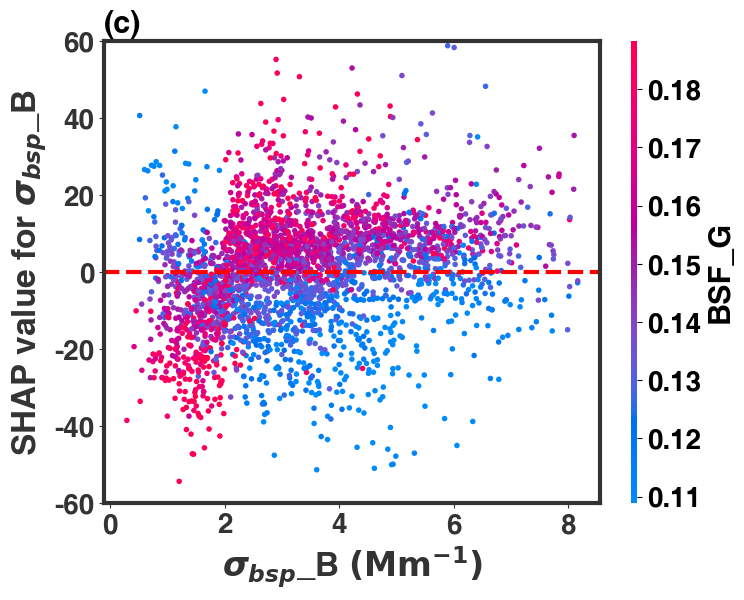

In [284]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BBS_B",  # key feature
    shap_interaction_values[:, :, selected_X_test.columns.get_loc("BSF_G")],  
    selected_X_test,
    interaction_index="BSF_G",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_ylim(-60,60)
# ax.set_title('(e)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.set_title('(c)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
plt.savefig('E:/aabc/summary/fig-250416/sgp3.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


In [145]:
# save
shap_values_df = pd.DataFrame(shap_values, columns=X_train.columns)

shap_values_df
shap_values_df.to_csv('E:/aabc\myDeepTree\data-250311/sgpshap_values.csv', index=False)

feature_importance = np.abs(shap_values_df).mean().sort_values(ascending=False)
feature_importance.to_csv('E:/aabc\myDeepTree\data-250311/sgpfeature_importance.csv')
total_shap = feature_importance.sum()

# contribution_ratio
feature_contribution_ratio = (feature_importance / total_shap) * 100

feature_contribution_ratio.to_csv('E:/aabc\myDeepTree\data-250311/sgpfeature_contribution_ratio.csv')


# <a id='toc3_'></a>[ENA](#toc0_)
## <a id='toc3_1_'></a>[Model](#toc0_)

In [9]:
# data reading
data_ena = pd.read_csv(r'E:/aabc\myDeepTree\data-250415/ba_qc/ena.csv')
data_ena = data_ena.replace(-9999, float('nan'))
data_ena.iloc[:, 0] = pd.to_numeric(data_ena.iloc[:, 0], errors='coerce')
data_ena = data_ena.dropna()
data_ena.columns = [
    'CCN', 'BS_B', 'BS_G', 'BS_R', 'AE_BG', 'AE_BR', 'AE_GR', 'BBS_B', 'BBS_G', 'BBS_R',
    'BSF_B', 'BSF_G', 'BSF_R',  'SSA_B', 'SSA_G', 'SSA_R', 
     'BA_B', 'BA_G', 'BA_R'
]
data_ena

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,176.299822,18.908558,17.229649,15.803927,0.709230,0.517723,0.358371,2.303230,1.991417,1.824346,0.121809,0.115581,0.115436,0.962009,0.962285,0.969464,0.746735,0.675293,0.497785
1,160.528417,6.574266,5.651323,2.897273,1.153844,2.598525,3.800642,0.779707,0.610495,0.426724,0.118600,0.108027,0.147285,0.975228,0.972802,0.925599,0.166996,0.158000,0.232886
2,143.402721,4.560722,3.658305,2.299650,1.681727,2.091219,2.431957,0.482790,0.373458,0.250264,0.105858,0.102085,0.108827,0.970461,0.973239,0.956303,0.138821,0.100594,0.105079
3,131.897689,4.900982,4.085695,2.100510,1.387783,2.665113,3.727977,0.670427,0.628157,0.446799,0.136794,0.153745,0.212710,0.967424,0.955687,0.933854,0.165030,0.189443,0.148781
4,151.094583,4.679729,3.748576,2.125704,1.692279,2.437604,3.057788,0.757422,0.494559,0.432839,0.161852,0.131933,0.203622,0.979789,0.965170,0.944364,0.096531,0.135273,0.125234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98294,130.295342,19.680948,18.582397,17.318554,0.438099,0.376667,0.325550,3.123639,2.649712,2.450387,0.158714,0.142593,0.141489,0.993454,0.993095,0.996069,0.129682,0.129212,0.068354
98295,203.804086,8.609408,6.605433,4.611516,2.021016,1.852139,1.711617,0.982587,0.685116,0.533725,0.114129,0.103720,0.115737,0.987022,0.981436,0.991600,0.113199,0.124946,0.039064
98296,207.756276,7.130406,6.212704,3.356178,1.050861,2.390918,3.505977,1.362682,0.969423,0.853603,0.191109,0.156039,0.254338,0.974565,0.974754,0.930116,0.186095,0.160911,0.252164
98297,110.423642,8.242971,7.294672,4.920620,0.932212,1.613145,2.179748,0.688618,0.638920,0.391787,0.083540,0.087587,0.079621,0.922676,0.925330,0.906185,0.690791,0.588647,0.509420


In [10]:
data_ena = data_ena[data_ena['CCN'] >0]
data_ena = data_ena[data_ena['AE_BG'] >0]
data_ena = data_ena[data_ena['AE_BR'] >0]
data_ena = data_ena[data_ena['AE_GR'] >0]
data_ena = data_ena[data_ena['BA_B'] >0]
data_ena = data_ena[data_ena['BA_G'] >0]
data_ena = data_ena[data_ena['BA_R'] >0]
data_ena = data_ena[data_ena['BS_B'] >0]
data_ena = data_ena[data_ena['BS_G'] >0]
data_ena = data_ena[data_ena['BS_R'] >0]
data_ena = data_ena[data_ena['BBS_B'] >0]
data_ena = data_ena[data_ena['BBS_G'] >0]
data_ena = data_ena[data_ena['BBS_R'] >0]
data_ena = data_ena[data_ena['BSF_B'] >0]
data_ena = data_ena[data_ena['BSF_G'] >0]   
data_ena = data_ena[data_ena['BSF_R'] >0]
data_ena = data_ena[data_ena['SSA_B'] <1]
data_ena = data_ena[data_ena['SSA_G'] <1]
data_ena = data_ena[data_ena['SSA_R'] <1]
data_ena = data_ena[data_ena['SSA_B'] >0]
data_ena = data_ena[data_ena['SSA_G'] >0]
data_ena = data_ena[data_ena['SSA_R'] >0]
def remove_outliers(df):
    # Remove outliers using the 3-sigma rule
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        cutoff = std * 3
        lower = mean - cutoff
        upper = mean + cutoff
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Apply function to remove outliers
data_ena = remove_outliers(data_ena)
data_ena


,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,176.299822,18.908558,17.229649,15.803927,0.709230,0.517723,0.358371,2.303230,1.991417,1.824346,0.121809,0.115581,0.115436,0.962009,0.962285,0.969464,0.746735,0.675293,0.497785
1,160.528417,6.574266,5.651323,2.897273,1.153844,2.598525,3.800642,0.779707,0.610495,0.426724,0.118600,0.108027,0.147285,0.975228,0.972802,0.925599,0.166996,0.158000,0.232886
2,143.402721,4.560722,3.658305,2.299650,1.681727,2.091219,2.431957,0.482790,0.373458,0.250264,0.105858,0.102085,0.108827,0.970461,0.973239,0.956303,0.138821,0.100594,0.105079
3,131.897689,4.900982,4.085695,2.100510,1.387783,2.665113,3.727977,0.670427,0.628157,0.446799,0.136794,0.153745,0.212710,0.967424,0.955687,0.933854,0.165030,0.189443,0.148781
4,151.094583,4.679729,3.748576,2.125704,1.692279,2.437604,3.057788,0.757422,0.494559,0.432839,0.161852,0.131933,0.203622,0.979789,0.965170,0.944364,0.096531,0.135273,0.125234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98293,104.343450,4.984999,4.169148,3.148076,1.363205,1.377594,1.389567,0.684301,0.649386,0.368773,0.137272,0.155760,0.117142,0.990573,0.983586,0.994697,0.047441,0.069575,0.016784
98294,130.295342,19.680948,18.582397,17.318554,0.438099,0.376667,0.325550,3.123639,2.649712,2.450387,0.158714,0.142593,0.141489,0.993454,0.993095,0.996069,0.129682,0.129212,0.068354
98295,203.804086,8.609408,6.605433,4.611516,2.021016,1.852139,1.711617,0.982587,0.685116,0.533725,0.114129,0.103720,0.115737,0.987022,0.981436,0.991600,0.113199,0.124946,0.039064
98296,207.756276,7.130406,6.212704,3.356178,1.050861,2.390918,3.505977,1.362682,0.969423,0.853603,0.191109,0.156039,0.254338,0.974565,0.974754,0.930116,0.186095,0.160911,0.252164


In [11]:
# data_ena = data_ena[data_ena['CCN'] >0]
# data_ena = data_ena[data_ena['AE_BG'] >0]
# data_ena = data_ena[data_ena['AE_BR'] >0]
# data_ena = data_ena[data_ena['AE_GR'] >0]
# data_ena = data_ena[data_ena['BA_B'] >0]
# data_ena = data_ena[data_ena['BA_G'] >0]
# data_ena = data_ena[data_ena['BA_R'] >0]
# data_ena = data_ena[data_ena['SSA_B'] <1]
# data_ena = data_ena[data_ena['SSA_G'] <1]
# data_ena = data_ena[data_ena['SSA_R'] <1]
# Prepare features and target variable
X_ena = data_ena.drop('CCN', axis=1)  # Features
y_ena = data_ena['CCN']  # Features
X_train_ena, X_test_ena, y_train_ena, y_test_ena = train_test_split(X_ena, y_ena, test_size=0.2, random_state=2024)

## <a id='toc2_2_'></a>[Bayesian optimization](#toc0_)

In [22]:
# Define parameter search space
xgb_params_ena = {
    'n_estimators': Integer(50, 1000),
    'max_depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'subsample': Real(0.5, 1.0),
    'colsample_bytree': Real(0.5, 1.0)
}

rf_params_ena = {
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(3, 16),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 6)
}
# CatBoost parameter space
cb_params_ena = {
    'iterations': Integer(50, 1000),
    'depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'l2_leaf_reg': Real(0.05, 10, prior='log-uniform'),
    'train_dir': Categorical(["./catboost_info"])  # Use the catboost_info folder in the current directory
}

# Create Bayesian optimization objects
opt_xgb_ena = BayesSearchCV(XGBRegressor(), xgb_params_ena, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_rf_ena = BayesSearchCV(RandomForestRegressor(), rf_params_ena, n_iter=3, cv=5, n_jobs=-1, verbose=10)
opt_cb_ena = BayesSearchCV(CatBoostRegressor(verbose=0), cb_params_ena, n_iter=10, cv=5, n_jobs=-1, verbose=10)

# Execute search
opt_xgb_ena.fit(X_train_ena, y_train_ena)
opt_rf_ena.fit(X_train_ena, y_train_ena)
opt_cb_ena.fit(X_train_ena, y_train_ena)

# Get best parameters
print("Best XGBoost params:", opt_xgb_ena.best_params_)
print("Best RF params:", opt_rf_ena.best_params_)
print("Best CatBoost params:", opt_cb_ena.best_params_)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

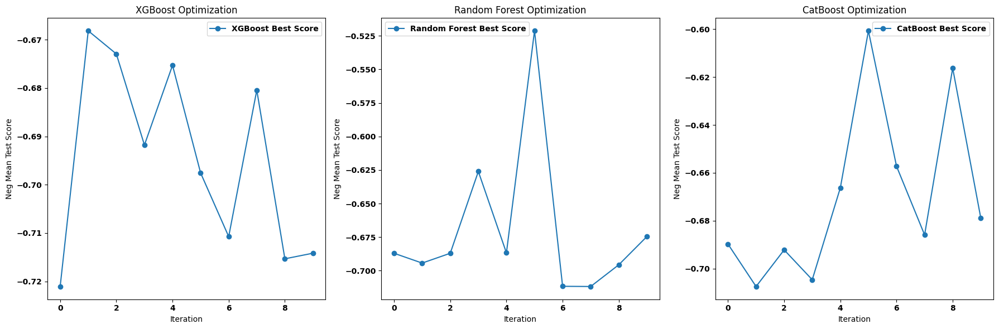

In [ ]:
from sklearn.ensemble import VotingRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Plot Bayesian optimization process
def plot_optimization_results(opt, model_name):
    results = opt.cv_results_
    best_scores = -np.array(results['mean_test_score'])
    plt.plot(best_scores, marker='o', label=f'{model_name} Best Score')
    plt.xlabel('Iteration')
    plt.ylabel('Neg Mean Test Score')
    plt.title(f'{model_name} Optimization')
    plt.legend()

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plot_optimization_results(opt_xgb_ena, "XGBoost")
plt.subplot(1, 3, 2)
plot_optimization_results(opt_rf_ena, "Random Forest")
plt.subplot(1, 3, 3)
plot_optimization_results(opt_cb_ena, "CatBoost")
plt.tight_layout()
plt.show()

# # Create models with best parameters
# xgb_best_ena = XGBRegressor(**opt_xgb_ena.best_params_, n_jobs=-1)
# rf_best_ena = RandomForestRegressor(**opt_rf_ena.best_params_, n_jobs=-1)
# cb_best_ena = CatBoostRegressor(**opt_cb_ena.best_params_, verbose=0)

# # Create ensemble model
# ensemble_model_ena = VotingRegressor(estimators=[
#     ('xgb', xgb_best_ena),
#     ('rf', rf_best_ena),
#     ('cb', cb_best_ena)
# ])

# # Train ensemble model
# ensemble_model_ena.fit(X_train_ena, y_train_ena)

# # Make predictions
# predictions_ena = ensemble_model_ena.predict(X_test_ena)

# # Evaluate model
# mse_ena = mean_squared_error(y_test_ena, predictions_ena)
# print(f'Mean Squared Error: {mse_ena}')


In [24]:
np.save(r'E:/aabc/myDeepTree/data-250329/enaxgb.npy', opt_xgb_ena.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250329/enarf.npy', opt_rf_ena.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250329/enacb.npy',opt_cb_ena.best_params_)

## <a id='toc3_2_'></a>[Load the best parameters directly](#toc0_)
### <a id='toc3_2_1_'></a>[If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc0_)

In [312]:
# If you want to reproduce the work of the paper, please use the following parameter file or use the attached parameters
opt_xgb_best_params_ena = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/ena/enaxgb.npy', allow_pickle=True).item()
opt_rf_best_params_ena = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/ena/enarf.npy', allow_pickle=True).item()
opt_cb_best_params_ena = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/ena/enacb.npy', allow_pickle=True).item()
print(opt_xgb_best_params_ena,opt_rf_best_params_ena,opt_cb_best_params_ena)

OrderedDict([('colsample_bytree', 0.5283530274106945), ('learning_rate', 0.06007496574272122), ('max_depth', 9), ('n_estimators', 210), ('subsample', 0.7707512365607301)]) OrderedDict([('max_depth', 15), ('min_samples_leaf', 5), ('min_samples_split', 3), ('n_estimators', 780)]) OrderedDict([('depth', 8), ('iterations', 776), ('l2_leaf_reg', 0.0987870748432461), ('learning_rate', 0.03133976317083961), ('train_dir', './catboost_info')])


In [99]:
# Use optimal parameters
xgb_best_ena = XGBRegressor(**opt_xgb_best_params_ena, n_jobs=-1)
rf_best_ena = RandomForestRegressor(**opt_rf_best_params_ena, n_jobs=-1)
# xgb_best = XGBRegressor(**opt_xgb_best_params)
# rf_best = RandomForestRegressor(**opt_rf_best_params)
cb_best_ena = CatBoostRegressor(**opt_cb_best_params_ena, verbose=0)

# Create an integration model
ensemble_model_ena = VotingRegressor(estimators=[
    ('xgb', xgb_best_ena),
    ('rf', rf_best_ena),
    ('cb', cb_best_ena)
])

ensemble_model_ena.fit(X_train_ena, y_train_ena)

predictions_ena = ensemble_model_ena.predict(X_test_ena)
mse_ena = mean_squared_error(y_test_ena, predictions_ena)
print(f'Mean Squared Error: {mse_ena}')


Mean Squared Error: 13634.063252567636


In [21]:
import joblib

model_filename = 'E:/aabc\myDeepTree\data-240806/ensemble_model_ena.pkl'
joblib.dump(ensemble_model_ena, model_filename)

print(f'Model saved to {model_filename}')


Model saved to E:/aabc\myDeepTree\data-240806/ensemble_model_ena.pkl


## <a id='toc3_3_'></a>[Data visualization](#toc0_)

FixedFormatter should only be used together with FixedLocator


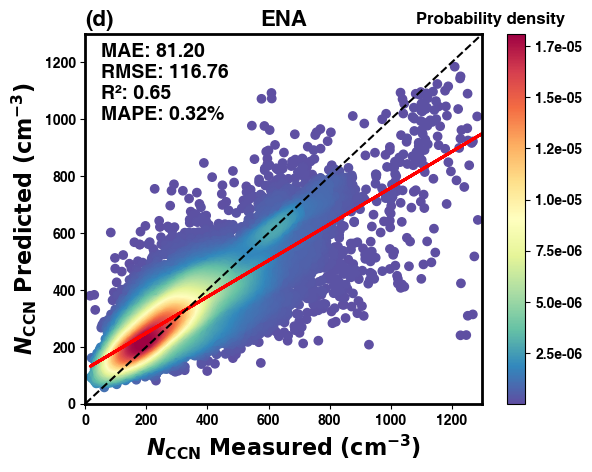

In [100]:

plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


x = y_test_ena.to_numpy()
y = predictions_ena

fig = plt.figure()
ax = fig.add_subplot(111)

ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

density_scatter(x=x, y=y, ax=ax, is_cbar=True)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

regression_line = slope * x + intercept
plt.plot(x, regression_line, 'red', lw=2, label='线性回归线')

plt.plot([0, 1300], [0, 1300], 'black', lw=1.5, linestyle='--')  # 1:1
plt.axis([0, 1300, 0, 1300])

ax.tick_params(axis='both', labelsize=14)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(200))
ax.yaxis.set_major_locator(MultipleLocator(200))
BIAS = mean(x - y)
MSE = mean_squared_error(x, y)
RMSE = np.power(MSE, 0.5)
R2 = r2_score(x, y)
MAE = mean_absolute_error(x, y)
EV = explained_variance_score(x, y)
MAPE = mean_absolute_percentage_error(x, y)
text = f'\nMAE: {MAE:.2f}\nRMSE: {RMSE:.2f}\nR²: {R2:.2f}\nMAPE: {MAPE:.2f}%'
plt.yticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(d)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('ENA', fontsize=16, fontname='Helvetica', fontweight='bold')
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.text(50,1000, text, fontsize=14, fontname='Helvetica')
plt.savefig('E:/aabc/summary/fig-250416/ena.png',dpi=300,bbox_inches='tight',pad_inches=0)

plt.show()


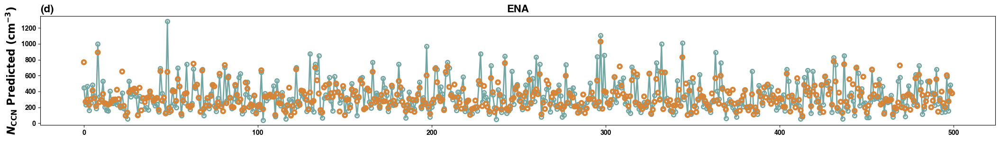

In [101]:

plt.figure(figsize=(26, 3))

plt.scatter(range(len(predictions_ena))[0:500], predictions_ena[0:500], label='Predicted Values', marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
plt.plot(range(len(y_test_ena))[0:500], y_test_ena[0:500],color='#73a5a2', label='True Values', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2,linewidth=2, zorder=1)
plt.title('ENA', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(d)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.xlabel('Sample Index')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.legend()
# plt.grid(True)
plt.savefig('E:/aabc/summary/fig-250416/ena-line.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()

## <a id='toc3_4_'></a>[SHAP for ENA](#toc0_)

In [102]:
# SHAP interactions are based on the xgboost model
xgb_model_ena = XGBRegressor(**opt_xgb_best_params_ena, n_jobs=-1)
xgb_model_ena.fit(X_train_ena, y_train_ena)
xgb_predictions_ena = xgb_model_ena.predict(X_test_ena)

In [12]:
# Randomly select 3000 samples for SHAP analysis
np.random.seed(2024)
indices_ena = np.random.choice(X_test_ena.shape[0], 3000, replace=False)
selected_X_test_ena = X_test_ena.iloc[indices_ena]


In [104]:
# selected_X_test_ena = X_test_ena  # Comment this out if using the random subset
# Create an explainer
explainer = shap.TreeExplainer(xgb_model_ena)
# Compute SHAP interaction values
shap_interaction_values_ena = explainer.shap_interaction_values(selected_X_test_ena)


In [105]:
# np.save('E:/aabc/myDeepTree/data-240806/sgpshap_values.npy', shap_values_sgp)
np.save(r'E:\aabc\myDeepTree\data-250415/ba_qc/enashap_interaction_values.npy', shap_interaction_values_ena)


In [106]:
# shap
explainer = shap.KernelExplainer(ensemble_model_ena.predict, data=X_train_ena.sample(100))
shap_values_ena = explainer.shap_values(X_test_ena.iloc[indices_ena])


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 0/3000 [00:00<?, ?it/s]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 1/3000 [00:03<3:09:14,  3.79s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 2/3000 [00:07<3:02:43,  3.66s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 3/3000 [00:10<3:01:58,  3.64s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was

In [107]:
np.save('E:/aabc/myDeepTree/data-250415/ba_qc/enashap_values.npy', shap_values_ena)

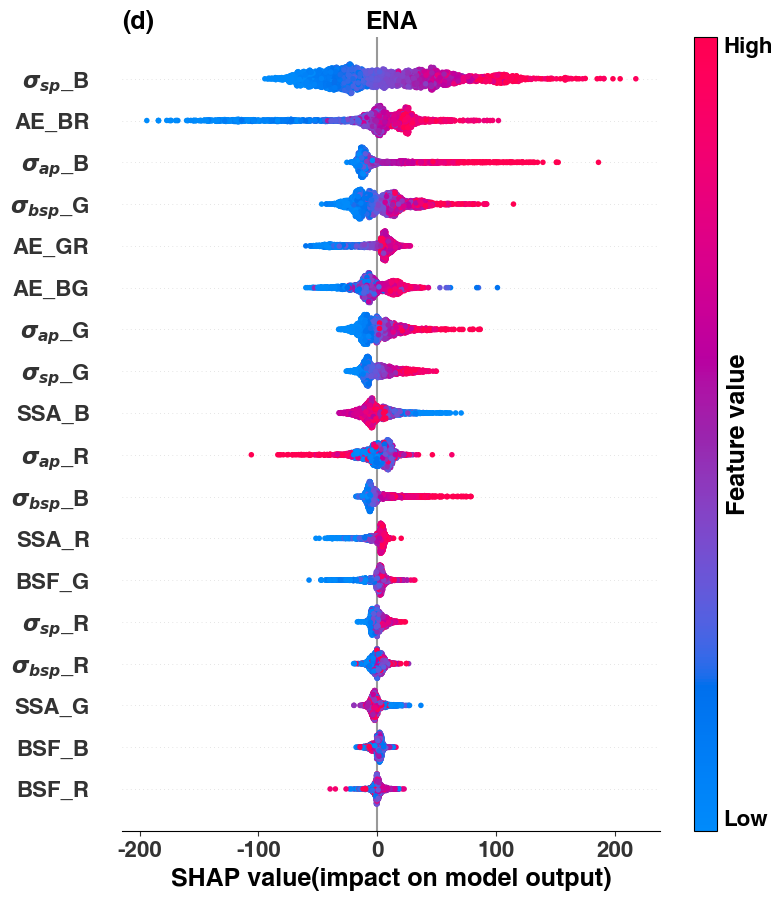

In [13]:
# summary
import os
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'

shap.summary_plot(shap_values_ena, selected_X_test_ena,feature_names=feature_names, show=False,color_bar=False)
cbar = plt.colorbar(aspect=35)
cbar.set_label('Feature value',size=18,fontname='Helvetica', fontweight='bold')
cbar.ax.set_yticklabels([])
cbar.ax.tick_params(axis='y', which='both', length=0)
cbar.ax.text(1.3,0,'Low',va='bottom',ha='left',transform=cbar.ax.transAxes,fontsize=16)
cbar.ax.text(1.3,1,'High',va='top',ha='left',transform=cbar.ax.transAxes,fontsize=16)

plt.xlabel('SHAP value(impact on model output)',fontsize=18,fontname='Helvetica', fontweight='bold')
plt.tick_params(axis='x',labelsize=16)
plt.tick_params(axis='y',labelsize=16)
plt.title('(d)', loc='left', fontsize=18, fontname='Helvetica', fontweight='bold')
plt.title('ENA', fontsize=18, fontname='Helvetica', fontweight='bold')
# plt.savefig('E:/aabc/summary/fig-240820/shap-ena.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


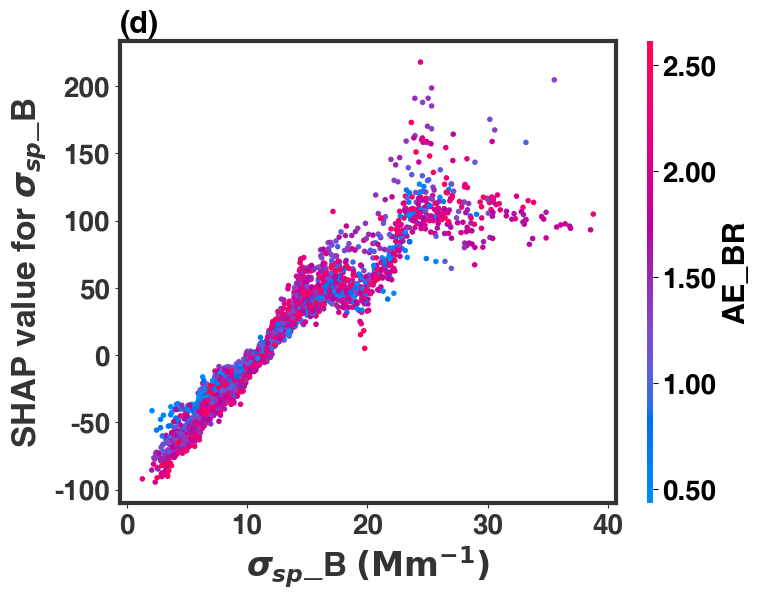

In [213]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'
# dependence
shap.dependence_plot('BS_B', shap_values_ena, selected_X_test_ena, interaction_index='AE_BR', ax=ax, show=False)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(d)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/ena1.png',dpi=300,bbox_inches='tight',pad_inches=0)

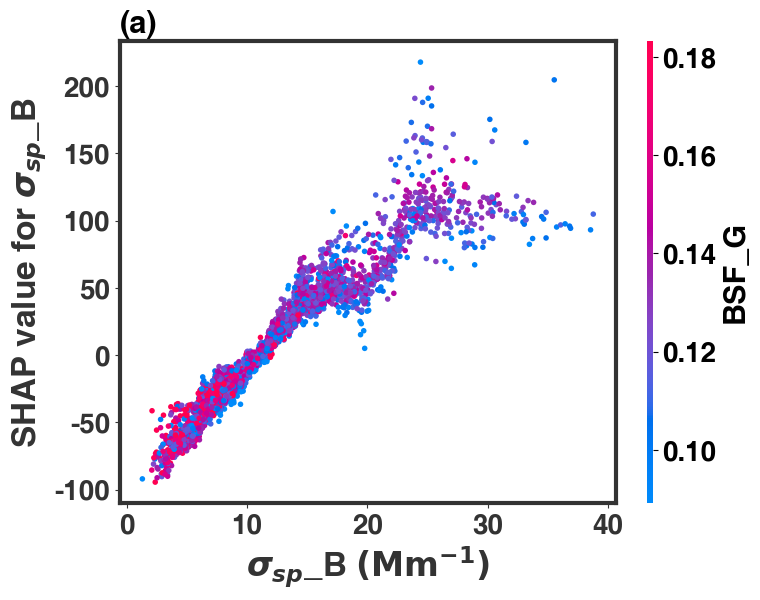

In [289]:
fig, ax = plt.subplots(figsize=(8, 6))

# dependence
shap.dependence_plot('BS_B', shap_values_ena, selected_X_test_ena, interaction_index='BSF_G', ax=ax, show=False)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(a)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/ena11.png',dpi=300,bbox_inches='tight',pad_inches=0)

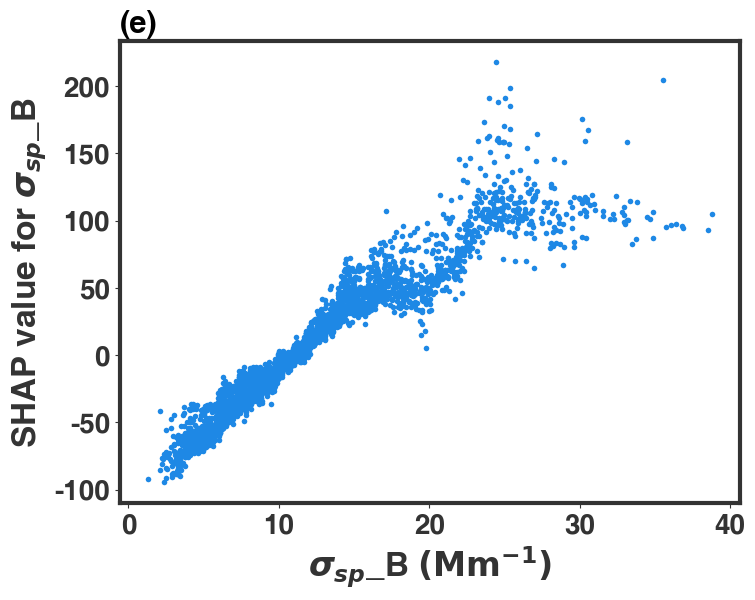

In [216]:
fig, ax = plt.subplots(figsize=(8, 6))

# dependence
shap.dependence_plot('BS_B', shap_values_ena, selected_X_test_ena, interaction_index=None, ax=ax, show=False)
# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=20) 
# cbar.set_label('BSF_G', fontsize=24) 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(e)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/ena2.png',dpi=300,bbox_inches='tight',pad_inches=0)

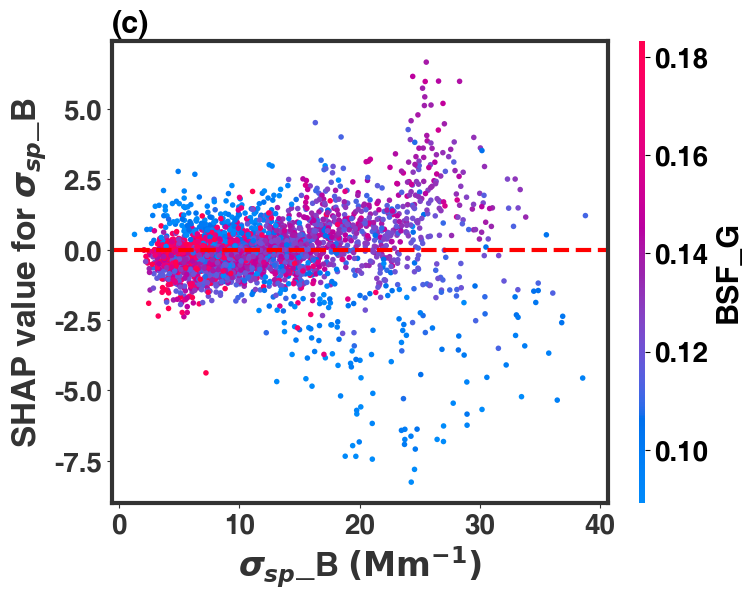

In [290]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_ena[:, :, selected_X_test_ena.columns.get_loc("BSF_G")],  
    selected_X_test_ena,
    interaction_index="BSF_G",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold')
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
# ax.set_title('(g)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(c)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/ena33.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


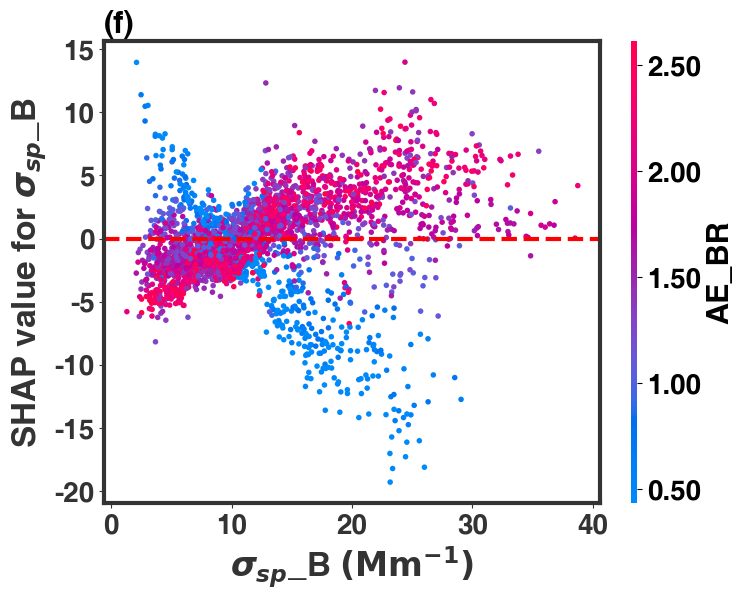

In [269]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_ena[:, :, selected_X_test_ena.columns.get_loc("AE_BR")],  
    selected_X_test_ena,
    interaction_index="AE_BR",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter) 
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
# ax.set_title('(h)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(f)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/ena3.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


In [146]:
# save
shap_values_df_ena = pd.DataFrame(shap_values_ena, columns=X_train_ena.columns)

shap_values_df_ena
shap_values_df_ena.to_csv('E:/aabc\myDeepTree\data-250311/enashap_values.csv', index=False)

feature_importance_ena = np.abs(shap_values_df_ena).mean().sort_values(ascending=False)
feature_importance_ena.to_csv('E:/aabc\myDeepTree\data-250311/enafeature_importance.csv')
total_shap_ena = feature_importance_ena.sum()

# contribution_ratio
feature_contribution_ratio_ena = (feature_importance_ena / total_shap_ena) * 100

feature_contribution_ratio_ena.to_csv('E:/aabc\myDeepTree\data-250311/enafeature_contribution_ratio.csv')
feature_contribution_ratio_ena

BS_B     18.456617
AE_BR    18.245173
BA_G     13.597346
RH       12.321629
BA_B      6.254259
AE_BG     4.707789
AE_GR     3.927537
TR_R      3.192444
BBS_G     2.806364
TR_B      2.716700
BS_G      2.646911
BA_R      1.647223
BBS_B     1.438780
SSA_R     1.238169
BS_R      1.199079
BSF_G     1.068059
BBS_R     0.941026
SSA_B     0.855409
TR_G      0.841422
BSF_R     0.650987
SSA_G     0.628402
BSF_B     0.618674
dtype: float64

# <a id='toc4_'></a>[ASI](#toc0_)
## <a id='toc4_1_'></a>[Model](#toc0_)

In [14]:
# data reading
data_asi = pd.read_csv('E:/aabc\myDeepTree\data-250415/ba_qc/asi.csv')
data_asi = data_asi.replace(-9999, float('nan'))
data_asi.iloc[:, 0] = pd.to_numeric(data_asi.iloc[:, 0], errors='coerce')
data_asi = data_asi.dropna()
data_asi.columns = [
    'CCN', 'BS_B', 'BS_G', 'BS_R', 'AE_BG', 'AE_BR', 'AE_GR', 'BBS_B', 'BBS_G', 'BBS_R',
    'BSF_B', 'BSF_G', 'BSF_R',  'SSA_B', 'SSA_G', 'SSA_R', 
     'BA_B', 'BA_G', 'BA_R'
]
data_asi

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,257.913333,25.221218,20.733507,13.642276,1.494496,1.878437,2.197913,2.596369,2.187564,1.734913,0.102944,0.105509,0.127172,0.988358,0.986226,0.979372,0.297085,0.289573,0.287344
1,245.024444,24.871004,20.148209,13.358130,1.606262,1.889458,2.125105,2.446274,2.090649,1.629920,0.098358,0.103764,0.122017,0.987440,0.986217,0.981330,0.316341,0.281590,0.254141
2,247.926667,25.750801,21.047781,14.044926,1.538248,1.845891,2.101879,2.629593,2.178149,1.598210,0.102117,0.103486,0.113793,0.990091,0.987397,0.981506,0.257715,0.268656,0.264634
3,255.748889,27.144434,22.076563,14.652530,1.576274,1.876107,2.125598,2.834032,2.166021,1.865849,0.104406,0.098114,0.127340,0.991488,0.989648,0.983604,0.233022,0.230930,0.244241
4,309.308500,53.497734,46.977207,40.479550,0.991404,0.817336,0.672493,6.111368,5.706093,5.232894,0.114236,0.121465,0.129273,0.997083,0.996181,0.996309,0.156529,0.180089,0.149957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125801,29.279317,11.927535,10.100738,7.876160,1.268012,1.239669,1.216085,1.450312,1.409395,1.343550,0.121594,0.139534,0.170584,0.869935,0.867035,0.851247,1.783306,1.549015,1.376335
125802,28.905053,13.067955,11.281788,9.129624,1.121046,1.068460,1.024703,1.822294,1.617574,1.239617,0.139448,0.143379,0.135780,0.880156,0.877563,0.885935,1.779359,1.574023,1.175444
125803,26.566748,11.656331,9.971909,8.076291,1.190488,1.088251,1.003179,1.519444,1.124165,0.994771,0.130354,0.112733,0.123172,0.877897,0.876139,0.873154,1.621223,1.409736,1.173267
125804,29.068515,12.641921,10.631637,8.461431,1.320968,1.188779,1.078784,1.790204,1.620300,1.327565,0.141609,0.152404,0.156896,0.882422,0.878330,0.883262,1.684476,1.472740,1.118318


In [15]:
data_asi = data_asi[data_asi['CCN'] >0]
data_asi = data_asi[data_asi['AE_BG'] >0]
data_asi = data_asi[data_asi['AE_BR'] >0]
data_asi = data_asi[data_asi['AE_GR'] >0]
data_asi = data_asi[data_asi['BA_B'] >0]
data_asi = data_asi[data_asi['BA_G'] >0]
data_asi = data_asi[data_asi['BA_R'] >0]
data_asi = data_asi[data_asi['BS_B'] >0]
data_asi = data_asi[data_asi['BS_G'] >0]
data_asi = data_asi[data_asi['BS_R'] >0]
data_asi = data_asi[data_asi['BBS_B'] >0]
data_asi = data_asi[data_asi['BBS_G'] >0]
data_asi = data_asi[data_asi['BBS_R'] >0]
data_asi = data_asi[data_asi['BSF_B'] >0]
data_asi = data_asi[data_asi['BSF_G'] >0]   
data_asi = data_asi[data_asi['BSF_R'] >0]
data_asi = data_asi[data_asi['SSA_B'] <1]
data_asi = data_asi[data_asi['SSA_G'] <1]
data_asi = data_asi[data_asi['SSA_R'] <1]
data_asi = data_asi[data_asi['SSA_B'] >0]
data_asi = data_asi[data_asi['SSA_G'] >0]
data_asi = data_asi[data_asi['SSA_R'] >0]
def remove_outliers(df):
    # Remove outliers using the 3-sigma rule
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        cutoff = std * 3
        lower = mean - cutoff
        upper = mean + cutoff
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Apply function to remove outliers
data_asi = remove_outliers(data_asi)
data_asi


,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,257.913333,25.221218,20.733507,13.642276,1.494496,1.878437,2.197913,2.596369,2.187564,1.734913,0.102944,0.105509,0.127172,0.988358,0.986226,0.979372,0.297085,0.289573,0.287344
1,245.024444,24.871004,20.148209,13.358130,1.606262,1.889458,2.125105,2.446274,2.090649,1.629920,0.098358,0.103764,0.122017,0.987440,0.986217,0.981330,0.316341,0.281590,0.254141
2,247.926667,25.750801,21.047781,14.044926,1.538248,1.845891,2.101879,2.629593,2.178149,1.598210,0.102117,0.103486,0.113793,0.990091,0.987397,0.981506,0.257715,0.268656,0.264634
3,255.748889,27.144434,22.076563,14.652530,1.576274,1.876107,2.125598,2.834032,2.166021,1.865849,0.104406,0.098114,0.127340,0.991488,0.989648,0.983604,0.233022,0.230930,0.244241
4,309.308500,53.497734,46.977207,40.479550,0.991404,0.817336,0.672493,6.111368,5.706093,5.232894,0.114236,0.121465,0.129273,0.997083,0.996181,0.996309,0.156529,0.180089,0.149957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125801,29.279317,11.927535,10.100738,7.876160,1.268012,1.239669,1.216085,1.450312,1.409395,1.343550,0.121594,0.139534,0.170584,0.869935,0.867035,0.851247,1.783306,1.549015,1.376335
125802,28.905053,13.067955,11.281788,9.129624,1.121046,1.068460,1.024703,1.822294,1.617574,1.239617,0.139448,0.143379,0.135780,0.880156,0.877563,0.885935,1.779359,1.574023,1.175444
125803,26.566748,11.656331,9.971909,8.076291,1.190488,1.088251,1.003179,1.519444,1.124165,0.994771,0.130354,0.112733,0.123172,0.877897,0.876139,0.873154,1.621223,1.409736,1.173267
125804,29.068515,12.641921,10.631637,8.461431,1.320968,1.188779,1.078784,1.790204,1.620300,1.327565,0.141609,0.152404,0.156896,0.882422,0.878330,0.883262,1.684476,1.472740,1.118318


In [16]:

# Prepare features and target variable
X_asi = data_asi.drop('CCN', axis=1)  # Features
y_asi = data_asi['CCN']  # Features
X_train_asi, X_test_asi, y_train_asi, y_test_asi = train_test_split(X_asi, y_asi, test_size=0.2, random_state=2024)

## <a id='toc2_2_'></a>[Bayesian optimization](#toc0_)

In [26]:
# Define parameter search space
xgb_params_asi = {
    'n_estimators': Integer(50, 1000),
    'max_depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'subsample': Real(0.5, 1.0),
    'colsample_bytree': Real(0.5, 1.0)
}

rf_params_asi = {
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(3, 16),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 6)
}
# CatBoost parameter space
cb_params_asi = {
    'iterations': Integer(50, 1000),
    'depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'l2_leaf_reg': Real(0.05, 10, prior='log-uniform'),
    'train_dir': Categorical(["./catboost_info"])  # Use the catboost_info folder in the current directory
}

# Create Bayesian optimization objects
opt_xgb_asi = BayesSearchCV(XGBRegressor(), xgb_params_asi, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_rf_asi = BayesSearchCV(RandomForestRegressor(), rf_params_asi, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_cb_asi = BayesSearchCV(CatBoostRegressor(verbose=0), cb_params_asi, n_iter=10, cv=5, n_jobs=-1, verbose=10)

# Execute search
opt_xgb_asi.fit(X_train_asi, y_train_asi)
opt_rf_asi.fit(X_train_asi, y_train_asi)
opt_cb_asi.fit(X_train_asi, y_train_asi)

# Get best parameters
print("Best XGBoost params:", opt_xgb_asi.best_params_)
print("Best RF params:", opt_rf_asi.best_params_)
print("Best CatBoost params:", opt_cb_asi.best_params_)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

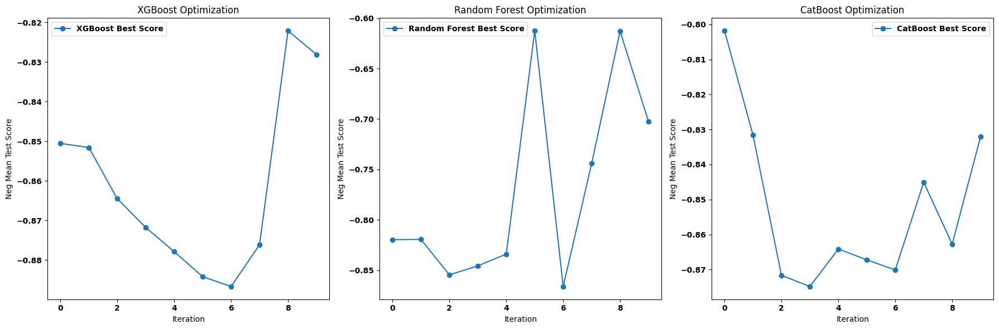

In [ ]:
from sklearn.ensemble import VotingRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Plot Bayesian optimization process
def plot_optimization_results(opt, model_name):
    results = opt.cv_results_
    best_scores = -np.array(results['mean_test_score'])
    plt.plot(best_scores, marker='o', label=f'{model_name} Best Score')
    plt.xlabel('Iteration')
    plt.ylabel('Neg Mean Test Score')
    plt.title(f'{model_name} Optimization')
    plt.legend()

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plot_optimization_results(opt_xgb_asi, "XGBoost")
plt.subplot(1, 3, 2)
plot_optimization_results(opt_rf_asi, "Random Forest")
plt.subplot(1, 3, 3)
plot_optimization_results(opt_cb_asi, "CatBoost")
plt.tight_layout()
plt.show()

# # Create models with best parameters
# xgb_best_asi = XGBRegressor(**opt_xgb_asi.best_params_, n_jobs=-1)
# rf_best_asi = RandomForestRegressor(**opt_rf_asi.best_params_, n_jobs=-1)
# cb_best_asi = CatBoostRegressor(**opt_cb_asi.best_params_, verbose=0)

# # Create ensemble model
# ensemble_model_asi = VotingRegressor(estimators=[
#     ('xgb', xgb_best_asi),
#     ('rf', rf_best_asi),
#     ('cb', cb_best_asi)
# ])

# # Train ensemble model
# ensemble_model_asi.fit(X_train_asi, y_train_asi)

# # Make predictions
# predictions_asi = ensemble_model_asi.predict(X_test_asi)

# # Evaluate model
# mse_asi = mean_squared_error(y_test_asi, predictions_asi)
# print(f'Mean Squared Error: {mse_asi}')


In [28]:
np.save(r'E:/aabc/myDeepTree/data-250327/asixgb.npy', opt_xgb_asi.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250327/asirf.npy', opt_rf_asi.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250327/asicb.npy',opt_cb_asi.best_params_)

## <a id='toc4_2_'></a>[Load the best parameters directly](#toc0_)
### <a id='toc4_2_1_'></a>[If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc0_)

In [313]:
# If you want to reproduce the work of the paper, please use the following parameter file or use the attached parameters
opt_xgb_best_params_asi = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/asi/asixgb.npy', allow_pickle=True).item()
opt_rf_best_params_asi = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/asi/asirf.npy', allow_pickle=True).item()
opt_cb_best_params_asi = np.load('E:/aabc/myDeepTree/data-250415/ba_qc/asi/asicb.npy', allow_pickle=True).item()
print(opt_xgb_best_params_asi,opt_rf_best_params_asi,opt_cb_best_params_asi)

OrderedDict([('colsample_bytree', 0.7761405956316005), ('learning_rate', 0.025421660238208917), ('max_depth', 13), ('n_estimators', 769), ('subsample', 0.8478225514123825)]) OrderedDict([('max_depth', 16), ('min_samples_leaf', 3), ('min_samples_split', 5), ('n_estimators', 511)]) OrderedDict([('depth', 10), ('iterations', 889), ('l2_leaf_reg', 0.09588967305774482), ('learning_rate', 0.030661516097944118), ('train_dir', './catboost_info')])


In [113]:
# Use optimal parameters
xgb_best_asi= XGBRegressor(**opt_xgb_best_params_asi, n_jobs=-1)
rf_best_asi = RandomForestRegressor(**opt_rf_best_params_asi, n_jobs=-1)
# xgb_best = XGBRegressor(**opt_xgb_best_params)
# rf_best = RandomForestRegressor(**opt_rf_best_params)
cb_best_asi = CatBoostRegressor(**opt_cb_best_params_asi, verbose=0)

# Create an integration model
ensemble_model_asi = VotingRegressor(estimators=[
    ('xgb', xgb_best_asi),
    ('rf', rf_best_asi),
    ('cb', cb_best_asi)
])

ensemble_model_asi.fit(X_train_asi, y_train_asi)

predictions_asi = ensemble_model_asi.predict(X_test_asi)
mse_asi = mean_squared_error(y_test_asi, predictions_asi)
print(f'Mean Squared Error: {mse_asi}')


Mean Squared Error: 2594.129361427442


In [9]:
import joblib

model_filename = 'E:/aabc\myDeepTree\data-240806/ensemble_model_asi.pkl'
joblib.dump(ensemble_model_asi, model_filename)

print(f'Model saved to {model_filename}')


Model saved to E:/aabc\myDeepTree\data-240806/ensemble_model_asi.pkl


## <a id='toc4_3_'></a>[Data visualization](#toc0_)

FixedFormatter should only be used together with FixedLocator


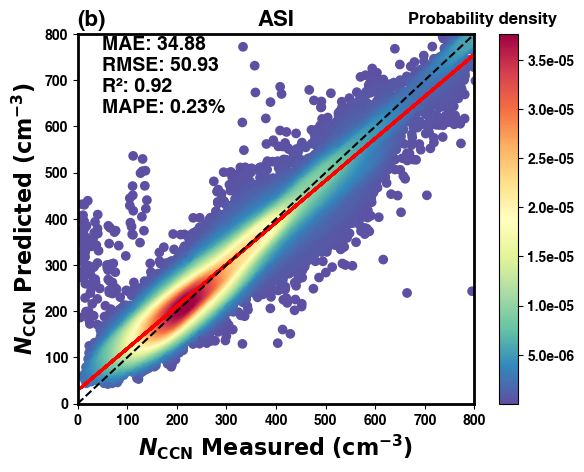

In [114]:

plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


x = y_test_asi.to_numpy()
y = predictions_asi

fig = plt.figure()
ax = fig.add_subplot(111)

ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

density_scatter(x=x, y=y, ax=ax, is_cbar=True)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

regression_line = slope * x + intercept
plt.plot(x, regression_line, 'red', lw=2, label='线性回归线')

plt.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
plt.axis([0, 800, 0, 800])

ax.tick_params(axis='both', labelsize=14)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
BIAS_asi = mean(x - y)
MSE_asi = mean_squared_error(x, y)
RMSE_asi = np.power(MSE_asi, 0.5)
R2_asi = r2_score(x, y)
MAE_asi = mean_absolute_error(x, y)
EV_asi = explained_variance_score(x, y)
MAPE_asi = mean_absolute_percentage_error(x, y)
text = f'\nMAE: {MAE_asi:.2f}\nRMSE: {RMSE_asi:.2f}\nR²: {R2_asi:.2f}\nMAPE: {MAPE_asi:.2f}%'
plt.yticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(b)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('ASI', fontsize=16, fontname='Helvetica', fontweight='bold')
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.text(50,630, text, fontsize=14, fontname='Helvetica')
plt.savefig('E:/aabc/summary/fig-250416/asi.png',dpi=300,bbox_inches='tight',pad_inches=0)

plt.show()


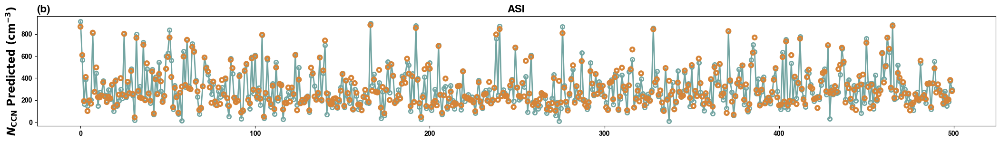

In [115]:

plt.figure(figsize=(26, 3))

plt.scatter(range(len(predictions_asi))[0:500], predictions_asi[0:500], label='Predicted Values', marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
plt.plot(range(len(y_test_asi))[0:500], y_test_asi[0:500],color='#73a5a2', label='True Values', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2,linewidth=2, zorder=1)
plt.title('ASI', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(b)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.xlabel('Sample Index')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.legend()
# plt.grid(True)
plt.savefig('E:/aabc/summary/fig-250416/asi-line.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()

## <a id='toc4_4_'></a>[SHAP for ASI](#toc0_)

In [116]:
# SHAP interactions are based on the xgboost model
xgb_model_asi = XGBRegressor(**opt_xgb_best_params_asi, n_jobs=-1)
xgb_model_asi.fit(X_train_asi, y_train_asi)
xgb_predictions_asi = xgb_model_asi.predict(X_test_asi)

In [17]:
# Randomly select 3000 samples for SHAP analysis
np.random.seed(2024)
indices_asi = np.random.choice(X_test_asi.shape[0], 3000, replace=False)
selected_X_test_asi = X_test_asi.iloc[indices_asi]


In [122]:
# selected_X_test_asi = X_test_asi  # Comment this out if using the random subset
# Create an explainer
explainer = shap.TreeExplainer(xgb_model_asi)
# Compute SHAP interaction values
shap_interaction_values_asi = explainer.shap_interaction_values(selected_X_test_asi)


In [123]:
# np.save('E:/aabc/myDeepTree/data-240806/sgpshap_values.npy', shap_values_sgp)
np.save(r'E:\aabc\myDeepTree\data-250415/ba_qc/asishap_interaction_values.npy', shap_interaction_values_asi)


In [118]:
# shap
explainer = shap.KernelExplainer(ensemble_model_asi.predict, data=X_train_asi.sample(100))
shap_values_asi = explainer.shap_values(X_test_asi.iloc[indices_asi])


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 0/3000 [00:00<?, ?it/s]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 1/3000 [00:05<4:15:21,  5.11s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 2/3000 [00:10<4:16:51,  5.14s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 3/3000 [00:15<4:11:03,  5.03s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was

In [119]:
np.save('E:/aabc/myDeepTree/data-250415/ba_qc/asishap_values.npy', shap_values_asi)

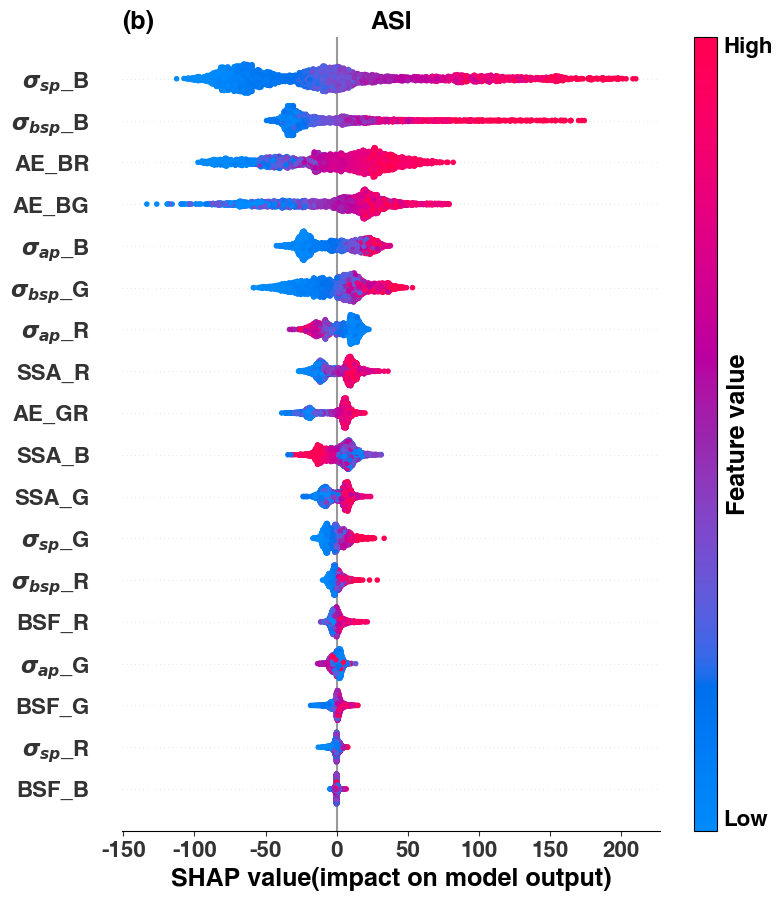

In [18]:
# summary
import os
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'

shap.summary_plot(shap_values_asi, selected_X_test_asi, feature_names=feature_names,show=False,color_bar=False)
cbar = plt.colorbar(aspect=35)
cbar.set_label('Feature value',size=18,fontname='Helvetica', fontweight='bold')
cbar.ax.set_yticklabels([])
cbar.ax.tick_params(axis='y', which='both', length=0)
cbar.ax.text(1.3,0,'Low',va='bottom',ha='left',transform=cbar.ax.transAxes,fontsize=16)
cbar.ax.text(1.3,1,'High',va='top',ha='left',transform=cbar.ax.transAxes,fontsize=16)

plt.xlabel('SHAP value(impact on model output)',fontsize=18,fontname='Helvetica', fontweight='bold')
plt.tick_params(axis='x',labelsize=16)
plt.tick_params(axis='y',labelsize=16)
plt.title('(b)', loc='left', fontsize=18, fontname='Helvetica', fontweight='bold')
plt.title('ASI', fontsize=18, fontname='Helvetica', fontweight='bold')
# plt.savefig('E:/aabc/summary/fig-250416/shap-asi.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


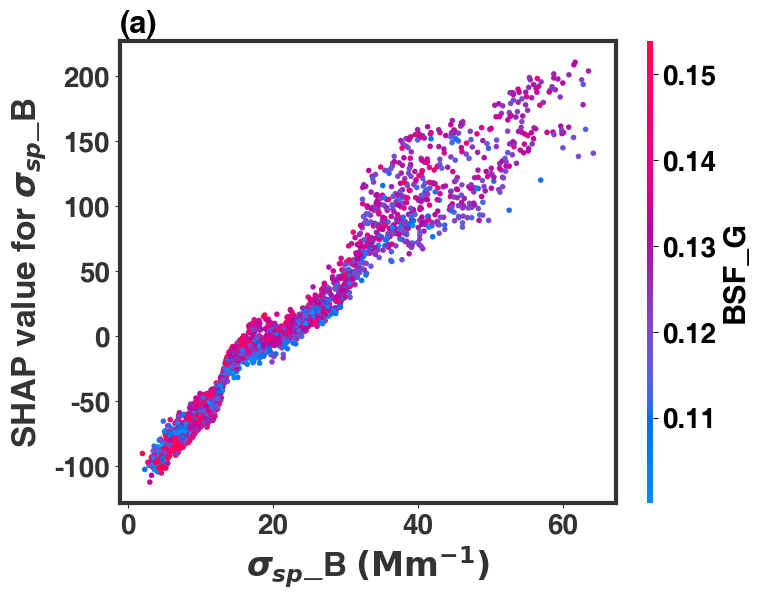

In [295]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_asi, selected_X_test_asi, interaction_index='BSF_G', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(a)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/asi11.png',dpi=300,bbox_inches='tight',pad_inches=0)

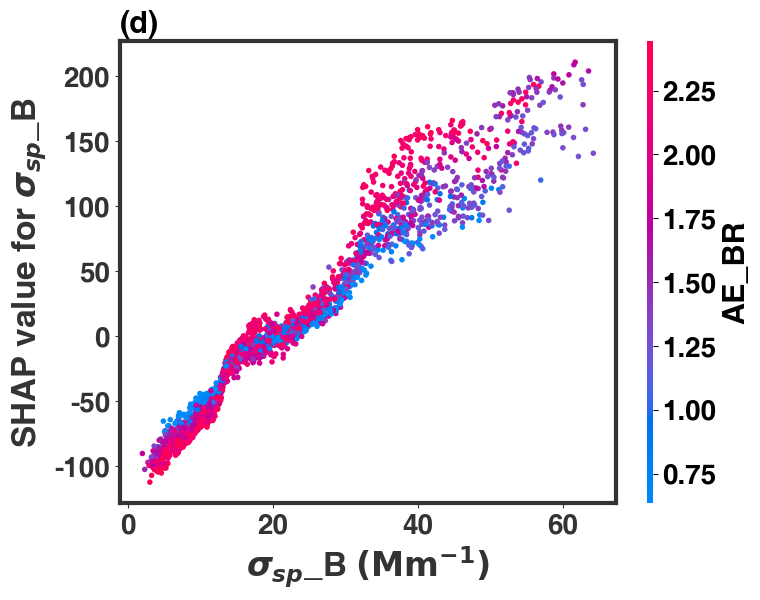

In [224]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_asi, selected_X_test_asi, interaction_index='AE_BR', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(d)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/asi1.png',dpi=300,bbox_inches='tight',pad_inches=0)

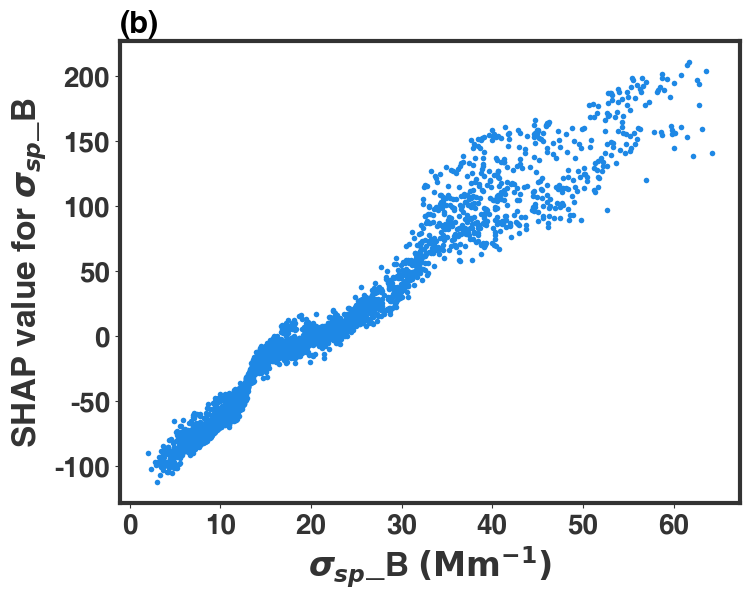

In [225]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_asi, selected_X_test_asi, interaction_index=None, ax=ax, show=False)
# dependence

# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=20) 
# cbar.set_label('AE_BG', fontsize=24)
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(b)', loc='left', fontsize=22, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/asi22.png',dpi=300,bbox_inches='tight',pad_inches=0)

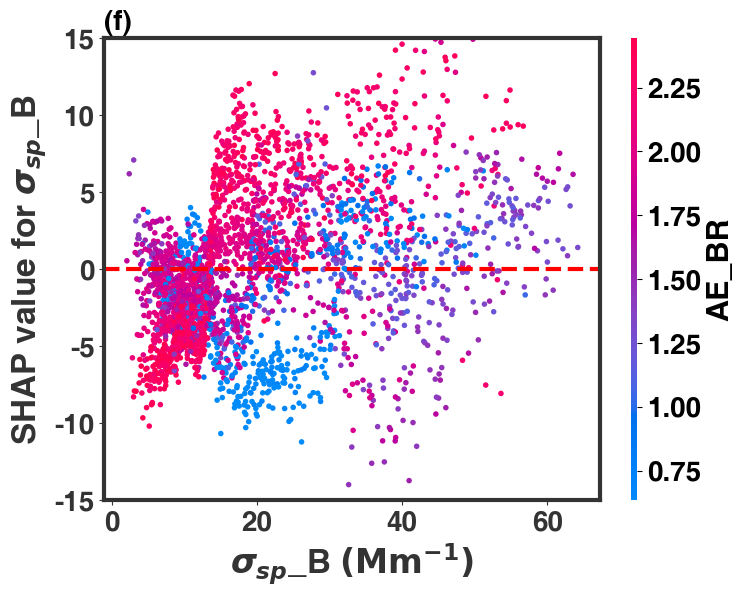

In [226]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_asi[:, :, selected_X_test_asi.columns.get_loc("AE_BR")],  
    selected_X_test_asi,
    interaction_index="AE_BR",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_ylim(-15,15)
ax.set_title('(f)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
plt.savefig('E:/aabc/summary/fig-250416/asi3.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


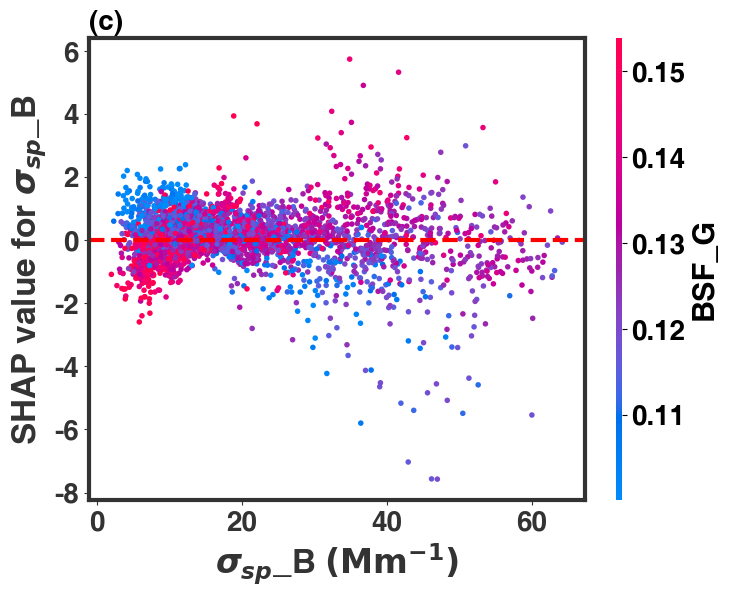

In [309]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_asi[:, :, selected_X_test_asi.columns.get_loc("BSF_G")],  
    selected_X_test_asi,
    interaction_index="BSF_G",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold')
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(c)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
plt.savefig('E:/aabc/summary/fig-250416/asi33.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


In [151]:
# save
shap_values_df_asi = pd.DataFrame(shap_values_asi, columns=X_train_asi.columns)

shap_values_df_asi
shap_values_df_asi.to_csv('E:/aabc\myDeepTree\data-250311/asishap_values.csv', index=False)

feature_importance_asi = np.abs(shap_values_df_asi).mean().sort_values(ascending=False)
feature_importance_asi.to_csv('E:/aabc\myDeepTree\data-250311/asifeature_importance.csv')
total_shap_asi = feature_importance_asi.sum()

# contribution_ratio
feature_contribution_ratio_asi = (feature_importance_asi / total_shap_asi) * 100

feature_contribution_ratio_asi.to_csv('E:/aabc\myDeepTree\data-250311/asifeature_contribution_ratio.csv')
feature_contribution_ratio_asi

BS_B     21.816528
AE_BR     9.329104
BBS_B     8.918948
BA_B      8.228910
TR_B      7.327699
AE_BG     7.180340
TR_R      6.643684
RH        4.442885
BBS_G     3.746488
BA_R      3.527662
BS_G      3.367049
SSA_B     2.631087
SSA_G     2.329185
AE_GR     2.263605
SSA_R     1.987397
BSF_R     1.429132
BBS_R     1.187894
BA_G      1.178642
BSF_G     0.871346
BS_R      0.673331
BSF_B     0.478890
TR_G      0.440193
dtype: float64

# <a id='toc5_'></a>[GUC](#toc0_)
## <a id='toc5_1_'></a>[Model](#toc0_)

In [24]:
# data reading
data_guc = pd.read_csv('E:/aabc\myDeepTree\data-250415/ba_qc/guc.csv')
data_guc = data_guc.replace(-9999, float('nan'))
data_guc.iloc[:, 0] = pd.to_numeric(data_guc.iloc[:, 0], errors='coerce')
data_guc = data_guc.dropna()
data_guc.columns = [
    'CCN', 'BS_B', 'BS_G', 'BS_R', 'AE_BG', 'AE_BR', 'AE_GR', 'BBS_B', 'BBS_G', 'BBS_R',
    'BSF_B', 'BSF_G', 'BSF_R', 'SSA_B', 'SSA_G', 'SSA_R', 
     'BA_B', 'BA_G', 'BA_R'
]
data_guc

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,535.120269,74.816250,56.877384,35.668404,2.090991,2.232016,2.349363,8.090380,6.721694,5.473801,0.108137,0.118179,0.153464,1.000252,1.000739,1.001551,-0.018846,-0.041993,-0.055244
1,545.864160,74.636530,57.276478,36.938404,2.019316,2.115565,2.195654,7.799878,6.430795,5.654231,0.104505,0.112276,0.153072,0.994050,0.992684,0.990996,0.446771,0.422109,0.335626
2,550.390953,74.701700,57.454643,36.812330,2.002280,2.131755,2.239491,7.313703,6.425041,5.584107,0.097905,0.111828,0.151691,0.986748,0.984402,0.980871,1.003262,0.910381,0.717933
3,542.025576,75.410805,57.344070,35.277245,2.089040,2.295290,2.466911,7.785453,6.828731,5.431006,0.103241,0.119083,0.153952,0.987453,0.986322,0.979924,0.958205,0.795238,0.722752
4,548.330045,73.943070,56.570800,36.157500,2.042675,2.153007,2.244813,7.625298,6.486101,5.421332,0.103124,0.114655,0.149937,0.993985,0.992129,0.986998,0.447462,0.448811,0.476301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26772,210.415140,4.221589,3.198411,2.205655,2.117080,1.924244,1.763786,0.946355,0.548142,0.329840,0.224170,0.171379,0.149543,0.807756,0.827585,0.807470,1.004725,0.666340,0.525908
26773,207.452149,4.665992,3.618177,2.337301,1.939912,2.084249,2.204352,1.036953,0.813147,0.665344,0.222236,0.224739,0.284664,0.700383,0.712260,0.675176,1.996062,1.461681,1.124467
26774,202.969963,3.947562,2.921042,1.621305,2.297093,2.705275,3.044923,0.846159,0.663434,0.566705,0.214350,0.227122,0.349537,0.712052,0.677851,0.593225,1.596364,1.388229,1.111729
26775,194.770631,4.104181,3.255551,2.673767,1.766879,1.228852,0.781160,1.405584,0.913345,0.793751,0.342476,0.280550,0.296866,0.758614,0.738702,0.745840,1.305921,1.151571,0.911142


In [25]:
data_guc = data_guc[data_guc['CCN'] >0]
data_guc = data_guc[data_guc['AE_BG'] >0]
data_guc = data_guc[data_guc['AE_BR'] >0]
data_guc = data_guc[data_guc['AE_GR'] >0]
data_guc = data_guc[data_guc['BA_B'] >0]
data_guc = data_guc[data_guc['BA_G'] >0]
data_guc = data_guc[data_guc['BA_R'] >0]
data_guc = data_guc[data_guc['BS_B'] >0]
data_guc = data_guc[data_guc['BS_G'] >0]
data_guc = data_guc[data_guc['BS_R'] >0]
data_guc = data_guc[data_guc['BBS_B'] >0]
data_guc = data_guc[data_guc['BBS_G'] >0]
data_guc = data_guc[data_guc['BBS_R'] >0]
data_guc = data_guc[data_guc['BSF_B'] >0]
data_guc = data_guc[data_guc['BSF_G'] >0]   
data_guc = data_guc[data_guc['BSF_R'] >0]
data_guc = data_guc[data_guc['SSA_B'] <1]
data_guc = data_guc[data_guc['SSA_G'] <1]
data_guc = data_guc[data_guc['SSA_R'] <1]
data_guc = data_guc[data_guc['SSA_B'] >0]
data_guc = data_guc[data_guc['SSA_G'] >0]
data_guc = data_guc[data_guc['SSA_R'] >0]
def remove_outliers(df):
    # Remove outliers using the 3-sigma rule
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        cutoff = std * 3
        lower = mean - cutoff
        upper = mean + cutoff
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Apply function to remove outliers
data_guc = remove_outliers(data_guc)
data_guc


,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
1,545.864160,74.636530,57.276478,36.938404,2.019316,2.115565,2.195654,7.799878,6.430795,5.654231,0.104505,0.112276,0.153072,0.994050,0.992684,0.990996,0.446771,0.422109,0.335626
2,550.390953,74.701700,57.454643,36.812330,2.002280,2.131755,2.239491,7.313703,6.425041,5.584107,0.097905,0.111828,0.151691,0.986748,0.984402,0.980871,1.003262,0.910381,0.717933
3,542.025576,75.410805,57.344070,35.277245,2.089040,2.295290,2.466911,7.785453,6.828731,5.431006,0.103241,0.119083,0.153952,0.987453,0.986322,0.979924,0.958205,0.795238,0.722752
4,548.330045,73.943070,56.570800,36.157500,2.042675,2.153007,2.244813,7.625298,6.486101,5.421332,0.103124,0.114655,0.149937,0.993985,0.992129,0.986998,0.447462,0.448811,0.476301
5,539.974473,75.579390,57.720448,36.082706,2.056173,2.231250,2.376931,7.579653,6.492123,5.664549,0.100287,0.112475,0.156988,0.997270,0.995366,0.991140,0.206916,0.268716,0.322543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26752,184.068451,7.290958,5.412528,3.559746,2.272387,2.132429,2.015970,0.991839,0.768523,0.489273,0.136037,0.141990,0.137446,0.954307,0.945613,0.929778,0.349096,0.311303,0.268853
26757,122.577676,2.490413,2.102985,1.618278,1.289746,1.290754,1.291592,0.382465,0.365325,0.171112,0.153575,0.173717,0.105737,0.958605,0.931461,0.949800,0.107542,0.154743,0.085531
26758,118.828535,2.658496,2.136248,1.561916,1.668216,1.583843,1.513636,0.429092,0.424553,0.317157,0.161404,0.198738,0.203057,0.954521,0.926627,0.929890,0.126666,0.169154,0.117761
26766,153.672413,2.937862,2.363200,1.559320,1.660249,1.922883,2.141421,0.385938,0.356668,0.342058,0.131367,0.150926,0.219363,0.945585,0.980836,0.981248,0.169062,0.046174,0.029798


In [26]:


# Prepare features and target variable
X_guc = data_guc.drop('CCN', axis=1)  # Features
y_guc = data_guc['CCN']  # Features
X_train_guc, X_test_guc, y_train_guc, y_test_guc = train_test_split(X_guc, y_guc, test_size=0.2, random_state=2024)

## <a id='toc2_2_'></a>[Bayesian optimization](#toc0_)

In [9]:

xgb_params = {
    'n_estimators': Integer(50, 1000),
    'max_depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'subsample': Real(0.5, 1.0),
    'colsample_bytree': Real(0.5, 1.0),
    'random_state': Categorical([2024]),  
   
}



rf_params = {
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(3, 16),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 6),
    'random_state': Categorical([2024])  
}


cb_params = {
    'iterations': Integer(50, 1000),
    'depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'l2_leaf_reg': Real(0.05, 10, prior='log-uniform'),
    'random_state': Categorical([2024]),  
    # 'task_type': Categorical(['GPU']),  
    # 'devices': Categorical(['0:1']),
    'train_dir': Categorical(["./catboost_info"])  
}


opt_xgb = BayesSearchCV(XGBRegressor(), xgb_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_rf = BayesSearchCV(RandomForestRegressor(), rf_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_cb = BayesSearchCV(CatBoostRegressor(verbose=0), cb_params, n_iter=10, cv=5, n_jobs=-1, verbose=10)


opt_xgb.fit(X_train_guc, y_train_guc)
opt_rf.fit(X_train_guc, y_train_guc)
opt_cb.fit(X_train_guc, y_train_guc)

print("Best XGBoost params:", opt_xgb.best_params_)
print("Best RF params:", opt_rf.best_params_)
print("Best CatBoost params:", opt_cb.best_params_)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

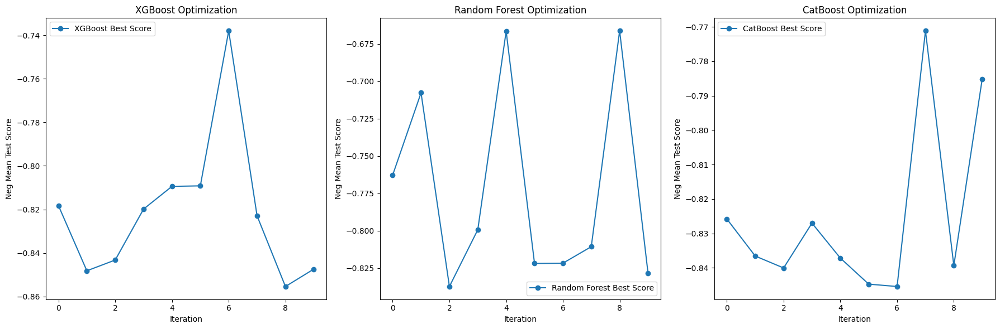

In [ ]:
from sklearn.ensemble import VotingRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Plot Bayesian optimization process
def plot_optimization_results(opt, model_name):
    results = opt.cv_results_
    best_scores = -np.array(results['mean_test_score'])
    plt.plot(best_scores, marker='o', label=f'{model_name} Best Score')
    plt.xlabel('Iteration')
    plt.ylabel('Neg Mean Test Score')
    plt.title(f'{model_name} Optimization')
    plt.legend()

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plot_optimization_results(opt_xgb_guc, "XGBoost")
plt.subplot(1, 3, 2)
plot_optimization_results(opt_rf_guc, "Random Forest")
plt.subplot(1, 3, 3)
plot_optimization_results(opt_cb_guc, "CatBoost")
plt.tight_layout()
plt.show()

# # Create models with best parameters
# xgb_best_guc = XGBRegressor(**opt_xgb_guc.best_params_, n_jobs=-1)
# rf_best_guc = RandomForestRegressor(**opt_rf_guc.best_params_, n_jobs=-1)
# cb_best_guc = CatBoostRegressor(**opt_cb_guc.best_params_, verbose=0)

# # Create ensemble model
# ensemble_model_guc = VotingRegressor(estimators=[
#     ('xgb', xgb_best_guc),
#     ('rf', rf_best_guc),
#     ('cb', cb_best_guc)
# ])

# # Train ensemble model
# ensemble_model_guc.fit(X_train_guc, y_train_guc)

# # Make predictions
# predictions_guc = ensemble_model_guc.predict(X_test_guc)

# # Evaluate model
# mse_guc = mean_squared_error(y_test_guc, predictions_guc)
# print(f'Mean Squared Error: {mse_guc}')


In [ ]:
np.save(r'E:/aabc/myDeepTree/data-250415/guc/gucxgb.npy', opt_xgb.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250415/guc/gucrf.npy', opt_rf.best_params_)
np.save(r'E:/aabc/myDeepTree/data-250415/guc/guccb.npy',opt_cb.best_params_)

## <a id='toc5_2_'></a>[Load the best parameters directly](#toc0_)
### <a id='toc5_2_1_'></a>[If you want to reproduce the results of the paper, please use the following parameters in the parameter file or attachment](#toc0_)

In [314]:
# If you want to reproduce the work of the paper, please use the following parameter file or use the attached parameters
opt_xgb_best_params_guc = np.load(r'E:/aabc/myDeepTree/data-250415/ba_qc/guc/gucxgb.npy', allow_pickle=True).item()
opt_rf_best_params_guc = np.load(r'E:/aabc/myDeepTree/data-250415/ba_qc/guc/gucrf.npy', allow_pickle=True).item()
opt_cb_best_params_guc = np.load(r'E:/aabc/myDeepTree/data-250415/ba_qc/guc/guccb.npy', allow_pickle=True).item()
print(opt_xgb_best_params_guc,opt_rf_best_params_guc,opt_cb_best_params_guc)

OrderedDict([('colsample_bytree', 0.8302862506936107), ('learning_rate', 0.016148709405183755), ('max_depth', 15), ('n_estimators', 350), ('subsample', 0.7365689190720379)]) OrderedDict([('max_depth', 14), ('min_samples_leaf', 5), ('min_samples_split', 3), ('n_estimators', 948)]) OrderedDict([('depth', 12), ('iterations', 670), ('l2_leaf_reg', 7.117888615154436), ('learning_rate', 0.03454788211866646), ('train_dir', './catboost_info')])


In [38]:
# Use optimal parameters
xgb_best_guc= XGBRegressor(**opt_xgb_best_params_guc, n_jobs=-1)
rf_best_guc = RandomForestRegressor(**opt_rf_best_params_guc, n_jobs=-1)
# xgb_best = XGBRegressor(**opt_xgb_best_params)
# rf_best = RandomForestRegressor(**opt_rf_best_params)
cb_best_guc = CatBoostRegressor(**opt_cb_best_params_guc, verbose=0)

# Create an integration model
ensemble_model_guc = VotingRegressor(estimators=[
    ('xgb', xgb_best_guc),
    ('rf', rf_best_guc),
    ('cb', cb_best_guc)
])

ensemble_model_guc.fit(X_train_guc, y_train_guc)

predictions_guc = ensemble_model_guc.predict(X_test_guc)
mse_guc = mean_squared_error(y_test_guc, predictions_guc)
print(f'Mean Squared Error: {mse_guc}')


Mean Squared Error: 3105.277655603892


In [12]:
import joblib

model_filename = 'E:/aabc\myDeepTree\data-250311/ensemble_model_guc.pkl'
joblib.dump(ensemble_model_guc, model_filename)

print(f'Model saved to {model_filename}')


Model saved to E:/aabc\myDeepTree\data-250311/ensemble_model_guc.pkl


## <a id='toc5_3_'></a>[Data visualization](#toc0_)

FixedFormatter should only be used together with FixedLocator


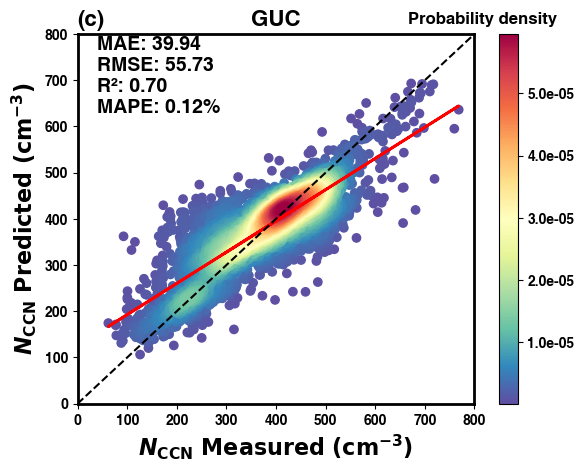

In [39]:

plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


x = y_test_guc.to_numpy()
y = predictions_guc

fig = plt.figure()
ax = fig.add_subplot(111)

ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

density_scatter(x=x, y=y, ax=ax, is_cbar=True)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

regression_line = slope * x + intercept
plt.plot(x, regression_line, 'red', lw=2, label='线性回归线')

plt.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
plt.axis([0, 800, 0, 800])

ax.tick_params(axis='both', labelsize=14)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
BIAS_guc = mean(x - y)
MSE_guc = mean_squared_error(x, y)
RMSE_guc = np.power(MSE_guc, 0.5)
R2_guc = r2_score(x, y)
MAE_guc = mean_absolute_error(x, y)
EV_guc = explained_variance_score(x, y)
MAPE_guc = mean_absolute_percentage_error(x, y)
text = f'\nMAE: {MAE_guc:.2f}\nRMSE: {RMSE_guc:.2f}\nR²: {R2_guc:.2f}\nMAPE: {MAPE_guc:.2f}%'
plt.yticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(c)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('GUC', fontsize=16, fontname='Helvetica', fontweight='bold')
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.text(40,630, text, fontsize=14, fontname='Helvetica')
plt.savefig(r'E:\aabc\summary\fig-250416/guc.png',dpi=300,bbox_inches='tight',pad_inches=0)

plt.show()


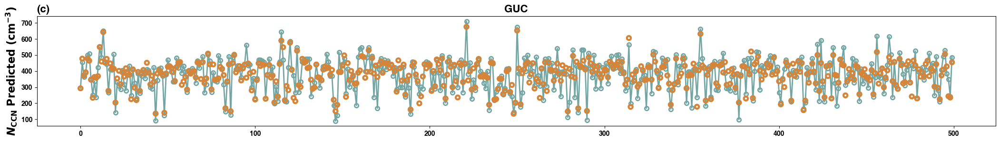

In [40]:

plt.figure(figsize=(26, 3))

plt.scatter(range(len(predictions_guc))[0:500], predictions_guc[0:500], label='Predicted Values', marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
plt.plot(range(len(y_test_guc))[0:500], y_test_guc[0:500],color='#73a5a2', label='True Values', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2,linewidth=2, zorder=1)
plt.title('GUC', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(c)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.xlabel('Sample Index')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
# plt.legend()
# plt.grid(True)
plt.savefig('E:/aabc/summary/fig-250416/guc-line.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()

## <a id='toc5_4_'></a>[SHAP for GUC](#toc0_)

In [41]:
# SHAP interactions are based on the xgboost model
xgb_model_guc = XGBRegressor(**opt_xgb_best_params_guc, n_jobs=-1)
xgb_model_guc.fit(X_train_guc, y_train_guc)
xgb_predictions_guc = xgb_model_guc.predict(X_test_guc)

In [27]:
# Randomly select 3000 samples for SHAP analysis
np.random.seed(2024)
indices_guc = np.random.choice(X_test_guc.shape[0], 3000, replace=False)
selected_X_test_guc = X_test_guc.iloc[indices_guc]


In [43]:
# selected_X_test_guc = X_test_guc  # Comment this out if using the random subset
# Create an explainer
explainer = shap.TreeExplainer(xgb_model_guc)
# Compute SHAP interaction values
shap_interaction_values_guc = explainer.shap_interaction_values(selected_X_test_guc)


In [44]:
# np.save('E:/aabc/myDeepTree/data-240806/sgpshap_values.npy', shap_values_sgp)
np.save(r'E:\aabc\myDeepTree\data-250415/ba_qc/gucshap_interaction_values.npy', shap_interaction_values_guc)


In [45]:
# shap
explainer = shap.KernelExplainer(ensemble_model_guc.predict, data=X_train_guc.sample(100))
shap_values = explainer.shap_values(X_test_guc.iloc[indices_guc])


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 0/3000 [00:00<?, ?it/s]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 1/3000 [00:05<4:53:47,  5.88s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 2/3000 [00:10<4:20:08,  5.21s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 3/3000 [00:15<4:04:43,  4.90s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was

In [46]:
np.save('E:/aabc/myDeepTree/data-250415/ba_qc/gucshap_values.npy', shap_values)

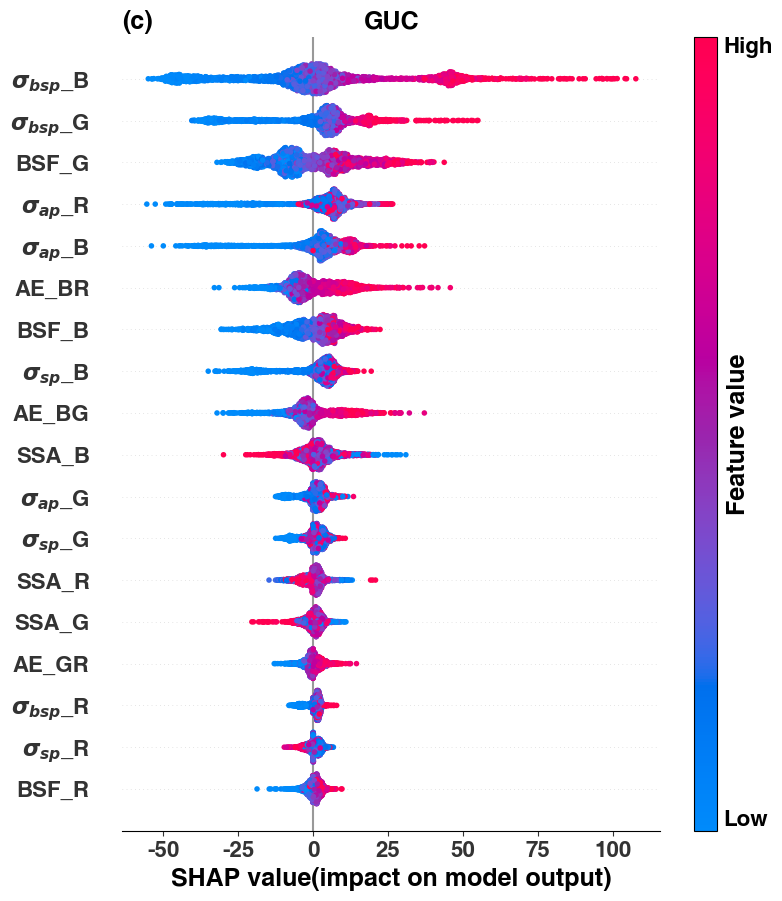

In [28]:
# summary
import os
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'

shap.summary_plot(shap_values_guc, selected_X_test_guc,feature_names=feature_names, show=False,color_bar=False)
cbar = plt.colorbar(aspect=35)
cbar.set_label('Feature value',size=18,fontname='Helvetica', fontweight='bold')
cbar.ax.set_yticklabels([])
cbar.ax.tick_params(axis='y', which='both', length=0)
cbar.ax.text(1.3,0,'Low',va='bottom',ha='left',transform=cbar.ax.transAxes,fontsize=16)
cbar.ax.text(1.3,1,'High',va='top',ha='left',transform=cbar.ax.transAxes,fontsize=16)

plt.xlabel('SHAP value(impact on model output)',fontsize=18,fontname='Helvetica', fontweight='bold')
plt.tick_params(axis='x',labelsize=16)
plt.tick_params(axis='y',labelsize=16)
plt.title('(c)', loc='left', fontsize=18, fontname='Helvetica', fontweight='bold')
plt.title('GUC', fontsize=18, fontname='Helvetica', fontweight='bold')
# plt.savefig('E:/aabc/summary/fig-250327/shap-guc.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


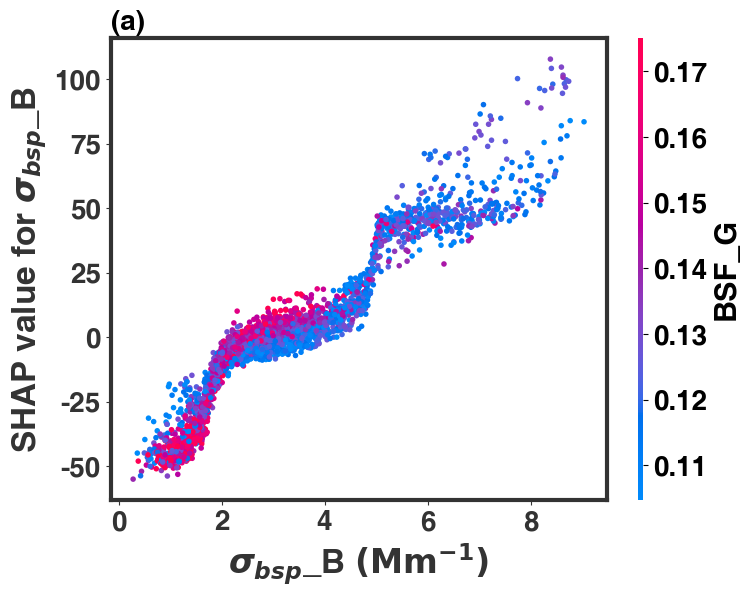

In [301]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values_guc, selected_X_test_guc, interaction_index='BSF_G', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(a)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/guc11.png',dpi=300,bbox_inches='tight',pad_inches=0)

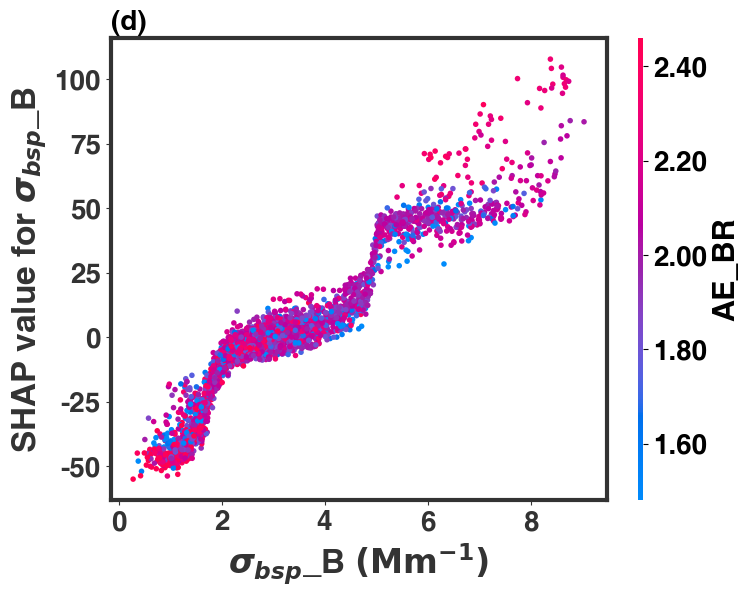

In [233]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values_guc, selected_X_test_guc, interaction_index='AE_BR', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(d)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/guc1.png',dpi=300,bbox_inches='tight',pad_inches=0)

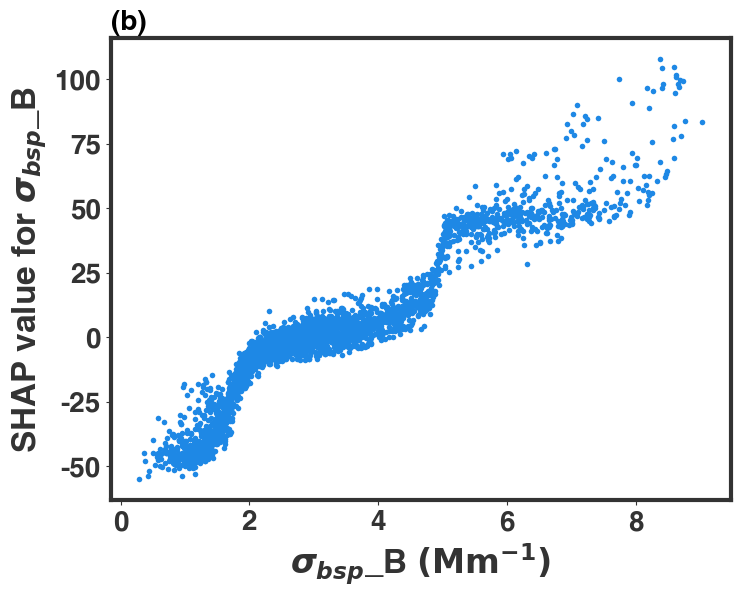

In [237]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BBS_B', shap_values_guc, selected_X_test_guc, interaction_index=None, ax=ax, show=False)
# dependence

# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=20) 
# cbar.set_label('AE_BG', fontsize=24)
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(b)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/guc22.png',dpi=300,bbox_inches='tight',pad_inches=0)

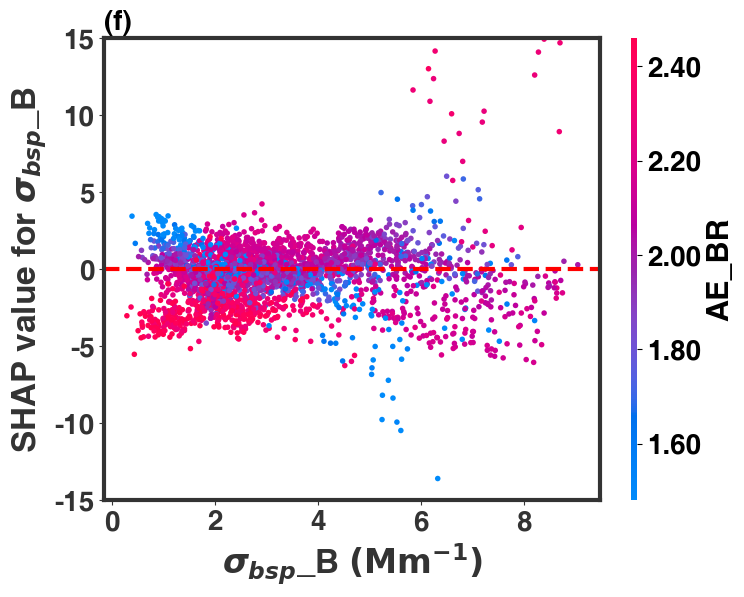

In [239]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BBS_B",  # key feature
    shap_interaction_values_guc[:, :, selected_X_test_guc.columns.get_loc("AE_BR")],  
    selected_X_test_guc,
    interaction_index="AE_BR",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_ylim(-15,15)
# ax.set_title('(f)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(f)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/guc33.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


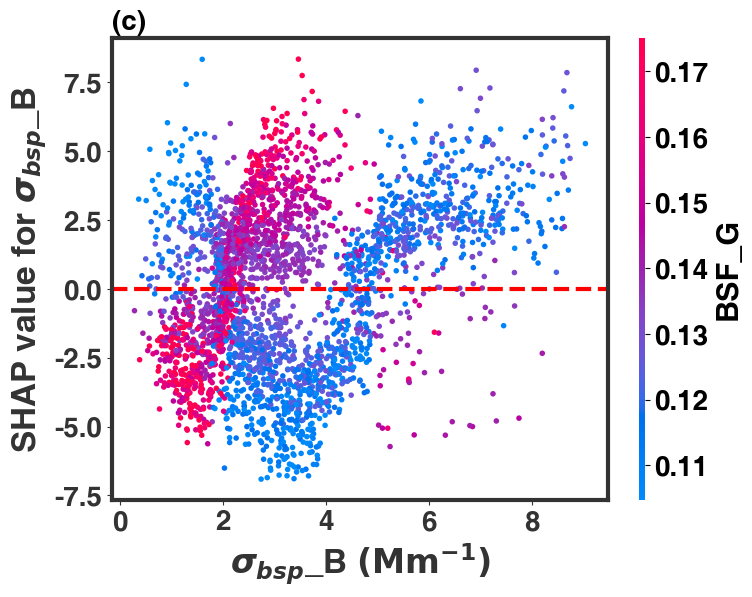

In [302]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BBS_B",  # key feature
    shap_interaction_values_guc[:, :, selected_X_test_guc.columns.get_loc("BSF_G")],  
    selected_X_test_guc,
    interaction_index="BSF_G",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{bsp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{bsp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
# ax.set_title('(e)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(c)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/guc3.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


In [148]:
# save
shap_values_df_guc = pd.DataFrame(shap_values, columns=X_train_guc.columns)

shap_values_df_guc
shap_values_df_guc.to_csv('E:/aabc\myDeepTree\data-250311/gucshap_values.csv', index=False)

feature_importance_guc = np.abs(shap_values_df_guc).mean().sort_values(ascending=False)
feature_importance_guc.to_csv('E:/aabc\myDeepTree\data-250311/gucfeature_importance.csv')
total_shap_guc = feature_importance_guc.sum()

# contribution_ratio
feature_contribution_ratio_guc = (feature_importance_guc / total_shap_guc) * 100

feature_contribution_ratio_guc.to_csv('E:/aabc\myDeepTree\data-250311/gucfeature_contribution_ratio.csv')
feature_contribution_ratio_guc

BBS_B    15.635571
BA_R     13.219504
RH       11.529892
BS_B     10.803273
BA_B      8.898654
BBS_G     6.902495
AE_BG     3.841344
BSF_G     3.470800
BA_G      3.083696
AE_BR     2.966289
TR_B      2.723026
TR_R      2.529000
SSA_B     2.394421
BS_G      2.288983
TR_G      2.099899
SSA_R     1.690466
BS_R      1.553856
BSF_B     1.173710
SSA_G     1.147737
AE_GR     0.701394
BBS_R     0.699825
BSF_R     0.646167
dtype: float64

# MOS

In [29]:
# data reading
data_mos = pd.read_csv(r'E:\aabc\myDeepTree\data-250415/ba_qc/mos.csv')
data_mos = data_mos.replace(-9999, float('nan'))
data_mos.iloc[:, 0] = pd.to_numeric(data_mos.iloc[:, 0], errors='coerce')
data_mos = data_mos.dropna()
data_mos.columns = [
    'CCN', 'BS_B', 'BS_G', 'BS_R', 'AE_BG', 'AE_BR', 'AE_GR', 'BBS_B', 'BBS_G', 'BBS_R',
    'BSF_B', 'BSF_G', 'BSF_R',  'SSA_B', 'SSA_G', 'SSA_R', 
     'BA_B', 'BA_G', 'BA_R'
]
data_mos

,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
0,17.691786,0.928003,0.857886,0.524161,0.599252,1.834491,2.862333,0.503194,0.401036,0.238178,0.542234,0.467470,0.454398,0.648706,0.650809,0.566432,0.502541,0.460298,0.401212
1,24.953310,1.719948,1.028744,0.451345,3.920216,4.014887,4.093663,0.588118,0.388576,0.230969,0.341939,0.377719,0.511735,0.821407,0.765387,0.682868,0.373958,0.315339,0.209610
2,29.130724,0.677624,0.575043,0.253738,1.252042,3.129792,4.692264,0.301710,0.208213,0.159173,0.445247,0.362082,0.627312,0.722085,0.702821,0.552568,0.260802,0.243150,0.205459
3,7.207341,2.505466,1.785842,1.336837,2.582565,1.802226,1.152908,0.514627,0.372642,0.312186,0.205402,0.208665,0.233526,0.932391,0.924995,0.906171,0.181675,0.144809,0.138423
4,8.424491,2.809753,1.931216,1.608535,2.859919,1.536884,0.435989,0.209039,0.122928,0.084352,0.074398,0.063653,0.052440,0.948364,0.930665,0.974991,0.152984,0.143877,0.041260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55158,91.488164,8.898543,7.227823,5.292771,1.586144,1.552070,1.523718,1.056179,0.777807,0.446299,0.118691,0.107613,0.084322,0.972910,0.968063,0.968539,0.247776,0.238447,0.171924
55159,87.639045,9.236236,7.309640,5.094836,1.784389,1.780761,1.777741,0.724802,0.624752,0.506086,0.078474,0.085470,0.099333,0.980407,0.977673,0.972922,0.184584,0.166930,0.141797
55160,87.423026,8.787906,6.996405,4.977571,1.738926,1.697724,1.663440,0.870891,0.666957,0.531150,0.099101,0.095328,0.106709,0.977157,0.973142,0.973341,0.205433,0.193097,0.136332
55161,91.194864,9.451076,7.680676,5.325417,1.582113,1.732579,1.857783,0.908264,0.788672,0.580944,0.096102,0.102683,0.109089,0.972535,0.969541,0.963108,0.266905,0.241294,0.203989


In [30]:
data_mos = data_mos[data_mos['CCN'] >0]
data_mos = data_mos[data_mos['AE_BG'] >0]
data_mos = data_mos[data_mos['AE_BR'] >0]
data_mos = data_mos[data_mos['AE_GR'] >0]
data_mos = data_mos[data_mos['BA_B'] >0]
data_mos = data_mos[data_mos['BA_G'] >0]
data_mos = data_mos[data_mos['BA_R'] >0]
data_mos = data_mos[data_mos['BS_B'] >0]
data_mos = data_mos[data_mos['BS_G'] >0]
data_mos = data_mos[data_mos['BS_R'] >0]
data_mos = data_mos[data_mos['BBS_B'] >0]
data_mos = data_mos[data_mos['BBS_G'] >0]
data_mos = data_mos[data_mos['BBS_R'] >0]
data_mos = data_mos[data_mos['BSF_B'] >0]
data_mos = data_mos[data_mos['BSF_G'] >0]   
data_mos = data_mos[data_mos['BSF_R'] >0]
data_mos = data_mos[data_mos['SSA_B'] <1]
data_mos = data_mos[data_mos['SSA_G'] <1]
data_mos = data_mos[data_mos['SSA_R'] <1]
data_mos = data_mos[data_mos['SSA_B'] >0]
data_mos = data_mos[data_mos['SSA_G'] >0]
data_mos = data_mos[data_mos['SSA_R'] >0]
def remove_outliers(df):
    # Remove outliers using the 3-sigma rule
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        cutoff = std * 3
        lower = mean - cutoff
        upper = mean + cutoff
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Apply function to remove outliers
data_mos = remove_outliers(data_mos)
data_mos


,CCN,BS_B,BS_G,BS_R,AE_BG,AE_BR,AE_GR,BBS_B,BBS_G,BBS_R,BSF_B,BSF_G,BSF_R,SSA_B,SSA_G,SSA_R,BA_B,BA_G,BA_R
4,8.424491,2.809753,1.931216,1.608535,2.859919,1.536884,0.435989,0.209039,0.122928,0.084352,0.074398,0.063653,0.052440,0.948364,0.930665,0.974991,0.152984,0.143877,0.041260
5,9.222334,3.185798,2.718422,2.384818,1.210119,0.828621,0.511178,0.302375,0.246301,0.120632,0.094914,0.090604,0.050583,0.915995,0.912672,0.909333,0.292167,0.260108,0.237783
6,8.094605,2.536240,1.954422,1.359184,1.987647,1.854203,1.743164,0.318253,0.183288,0.089292,0.125482,0.093781,0.065695,0.912082,0.892419,0.881988,0.244475,0.235605,0.181862
7,7.586641,3.795401,3.234736,2.842074,1.219205,0.826527,0.499779,0.564524,0.461582,0.215887,0.148739,0.142696,0.075961,0.934279,0.939310,0.931251,0.266984,0.209000,0.209813
8,9.176097,5.056887,4.085558,3.092067,1.626897,1.455526,1.312928,0.497479,0.365003,0.302081,0.098377,0.089340,0.097696,0.949376,0.952231,0.966357,0.269647,0.204955,0.107647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55158,91.488164,8.898543,7.227823,5.292771,1.586144,1.552070,1.523718,1.056179,0.777807,0.446299,0.118691,0.107613,0.084322,0.972910,0.968063,0.968539,0.247776,0.238447,0.171924
55159,87.639045,9.236236,7.309640,5.094836,1.784389,1.780761,1.777741,0.724802,0.624752,0.506086,0.078474,0.085470,0.099333,0.980407,0.977673,0.972922,0.184584,0.166930,0.141797
55160,87.423026,8.787906,6.996405,4.977571,1.738926,1.697724,1.663440,0.870891,0.666957,0.531150,0.099101,0.095328,0.106709,0.977157,0.973142,0.973341,0.205433,0.193097,0.136332
55161,91.194864,9.451076,7.680676,5.325417,1.582113,1.732579,1.857783,0.908264,0.788672,0.580944,0.096102,0.102683,0.109089,0.972535,0.969541,0.963108,0.266905,0.241294,0.203989


In [31]:

# Prepare features and target variable
X_mos = data_mos.drop('CCN', axis=1)  # Features
y_mos = data_mos['CCN']  # Features
X_train_mos, X_test_mos, y_train_mos, y_test_mos = train_test_split(X_mos, y_mos, test_size=0.2, random_state=2024)

In [ ]:
# Define parameter search space
xgb_params_mos = {
    'n_estimators': Integer(50, 1000),
    'max_depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'subsample': Real(0.5, 1.0),
    'colsample_bytree': Real(0.5, 1.0)
}

rf_params_mos = {
    'n_estimators': Integer(100, 1000),
    'max_depth': Integer(3, 16),
    'min_samples_split': Integer(2, 10),
    'min_samples_leaf': Integer(1, 6)
}
# CatBoost parameter space
cb_params_mos = {
    'iterations': Integer(50, 1000),
    'depth': Integer(3, 16),
    'learning_rate': Real(0.01, 0.4, prior='log-uniform'),
    'l2_leaf_reg': Real(0.05, 10, prior='log-uniform'),
    'train_dir': Categorical(["./catboost_info"])  # Use the catboost_info folder in the current directory
}

# Create Bayesian optimization objects
opt_xgb_mos = BayesSearchCV(XGBRegressor(), xgb_params_mos, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_rf_mos = BayesSearchCV(RandomForestRegressor(), rf_params_mos, n_iter=10, cv=5, n_jobs=-1, verbose=10)
opt_cb_mos = BayesSearchCV(CatBoostRegressor(verbose=0), cb_params_mos, n_iter=10, cv=5, n_jobs=-1, verbose=10)

# Execute search
opt_xgb_mos.fit(X_train_mos, y_train_mos)
opt_rf_mos.fit(X_train_mos, y_train_mos)
opt_cb_mos.fit(X_train_mos, y_train_mos)

# Get best parameters
print("Best XGBoost params:", opt_xgb_mos.best_params_)
print("Best RF params:", opt_rf_mos.best_params_)
print("Best CatBoost params:", opt_cb_mos.best_params_)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

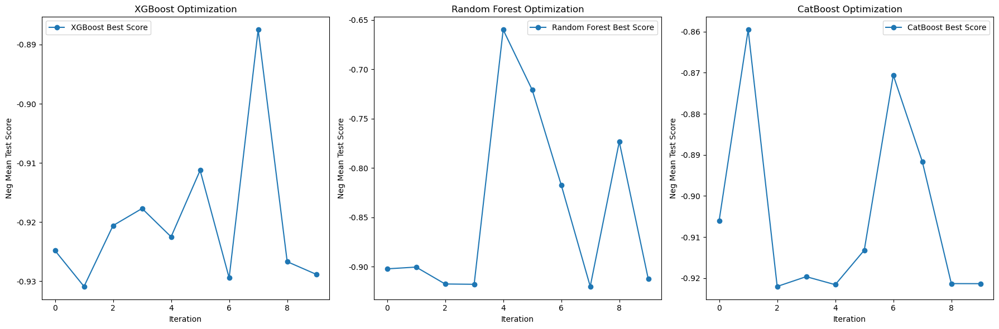

In [ ]:
from sklearn.ensemble import VotingRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

# Plot Bayesian optimization process
def plot_optimization_results(opt, model_name):
    results = opt.cv_results_
    best_scores = -np.array(results['mean_test_score'])
    plt.plot(best_scores, marker='o', label=f'{model_name} Best Score')
    plt.xlabel('Iteration')
    plt.ylabel('Neg Mean Test Score')
    plt.title(f'{model_name} Optimization')
    plt.legend()

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plot_optimization_results(opt_xgb_mos, "XGBoost")
plt.subplot(1, 3, 2)
plot_optimization_results(opt_rf_mos, "Random Forest")
plt.subplot(1, 3, 3)
plot_optimization_results(opt_cb_mos, "CatBoost")
plt.tight_layout()
plt.show()

# # Create models with best parameters
# xgb_best_mos = XGBRegressor(**opt_xgb_mos.best_params_, n_jobs=-1)
# rf_best_mos = RandomForestRegressor(**opt_rf_mos.best_params_, n_jobs=-1)
# cb_best_mos = CatBoostRegressor(**opt_cb_mos.best_params_, verbose=0)

# # Create ensemble model
# ensemble_model_mos = VotingRegressor(estimators=[
#     ('xgb', xgb_best_mos),
#     ('rf', rf_best_mos),
#     ('cb', cb_best_mos)
# ])

# # Train ensemble model
# ensemble_model_mos.fit(X_train_mos, y_train_mos)

# # Make predictions
# predictions_mos = ensemble_model_mos.predict(X_test_mos)

# # Evaluate model
# mse_mos = mean_squared_error(y_test_mos, predictions_mos)
# print(f'Mean Squared Error: {mse_mos}')


In [ ]:
np.save(r'E:\aabc\myDeepTree\data-250329/mosxgb.npy', opt_xgb_mos.best_params_)
np.save(r'E:\aabc\myDeepTree\data-250329/mosrf.npy', opt_rf_mos.best_params_)
np.save(r'E:\aabc\myDeepTree\data-250329/moscb.npy',opt_cb_mos.best_params_)

In [315]:
# If you want to reproduce the work of the paper, please use the following parameter file or use the attached parameters
opt_xgb_best_params_mos = np.load(r'E:\aabc\myDeepTree\data-250415/ba_qc/mos/mosxgb.npy', allow_pickle=True).item()
opt_rf_best_params_mos = np.load(r'E:\aabc\myDeepTree\data-250415/ba_qc/mos/mosrf.npy', allow_pickle=True).item()
opt_cb_best_params_mos = np.load(r'E:\aabc\myDeepTree\data-250415/ba_qc/mos/moscb.npy', allow_pickle=True).item()
print(opt_xgb_best_params_mos,opt_rf_best_params_mos,opt_cb_best_params_mos)

OrderedDict([('colsample_bytree', 0.7342856015202809), ('learning_rate', 0.07260725075988098), ('max_depth', 8), ('n_estimators', 160), ('subsample', 0.6768869692810671)]) OrderedDict([('max_depth', 10), ('min_samples_leaf', 2), ('min_samples_split', 6), ('n_estimators', 411)]) OrderedDict([('depth', 14), ('iterations', 911), ('l2_leaf_reg', 0.05227811690755287), ('learning_rate', 0.036505936666571925), ('train_dir', './catboost_info')])


In [157]:
# Use optimal parameters
xgb_best_mos= XGBRegressor(**opt_xgb_best_params_mos, n_jobs=-1)
rf_best_mos = RandomForestRegressor(**opt_rf_best_params_mos, n_jobs=-1)
# xgb_best = XGBRegressor(**opt_xgb_best_params)
# rf_best = RandomForestRegressor(**opt_rf_best_params)
cb_best_mos = CatBoostRegressor(**opt_cb_best_params_mos, verbose=0)

# Create an integration model
ensemble_model_mos = VotingRegressor(estimators=[
    ('xgb', xgb_best_mos),
    ('rf', rf_best_mos),
    ('cb', cb_best_mos)
])

ensemble_model_mos.fit(X_train_mos, y_train_mos)

predictions_mos = ensemble_model_mos.predict(X_test_mos)
mse_mos = mean_squared_error(y_test_mos, predictions_mos)
print(f'Mean Squared Error: {mse_mos}')


Mean Squared Error: 3423.278738147958


FixedFormatter should only be used together with FixedLocator


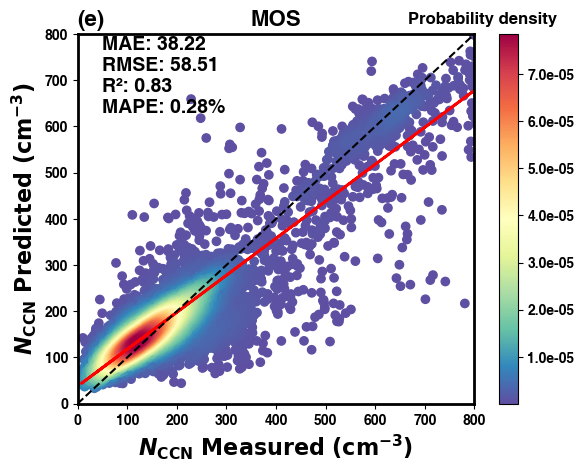

In [158]:

plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


x = y_test_mos.to_numpy()
y = predictions_mos

fig = plt.figure()
ax = fig.add_subplot(111)

ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

density_scatter(x=x, y=y, ax=ax, is_cbar=True)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

regression_line = slope * x + intercept
plt.plot(x, regression_line, 'red', lw=2, label='线性回归线')

plt.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
plt.axis([0, 800, 0, 800])

ax.tick_params(axis='both', labelsize=14)

ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
BIAS_mos = mean(x - y)
MSE_mos = mean_squared_error(x, y)
RMSE_mos = np.power(MSE_mos, 0.5)
R2_mos = r2_score(x, y)
MAE_mos = mean_absolute_error(x, y)
EV_mos = explained_variance_score(x, y)
MAPE_mos = mean_absolute_percentage_error(x, y)
text = f'\nMAE: {MAE_mos:.2f}\nRMSE: {RMSE_mos:.2f}\nR²: {R2_mos:.2f}\nMAPE: {MAPE_mos:.2f}%'
plt.yticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xticks(fontsize=10, fontname='Helvetica', fontweight='bold')
plt.xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('(e)', loc='left', fontsize=16, fontname='Helvetica', fontweight='bold')
plt.title('MOS', fontsize=16, fontname='Helvetica', fontweight='bold')
# ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.text(50,630, text, fontsize=14, fontname='Helvetica')
plt.savefig('E:/aabc/summary/fig-250416/mos.png',dpi=300,bbox_inches='tight',pad_inches=0)

plt.show()


In [159]:
# SHAP interactions are based on the xgboost model
xgb_model = XGBRegressor(**opt_xgb_best_params_mos, n_jobs=-1)
xgb_model.fit(X_train_mos, y_train_mos)
xgb_predictions = xgb_model.predict(X_test_mos)

In [32]:
# Randomly select 3000 samples for SHAP analysis
np.random.seed(2024)
indices = np.random.choice(X_test_mos.shape[0], 3000, replace=False)
# selected_X_test = X_test  # Comment this out if using the random subset
selected_X_test = X_test_mos.iloc[indices]

In [161]:
# shap
explainer = shap.KernelExplainer(ensemble_model_mos.predict, data=X_train_mos.sample(100))
shap_values = explainer.shap_values(X_test_mos.iloc[indices])


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 0/3000 [00:00<?, ?it/s]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 1/3000 [00:02<2:14:38,  2.69s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 2/3000 [00:04<2:03:09,  2.46s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  0%|          | 3/3000 [00:07<2:03:02,  2.46s/it]X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was

In [162]:
np.save('E:/aabc/myDeepTree/data-250415/ba_qc/mosshap_values.npy', shap_values)

In [163]:
# selected_X_test_guc = X_test_guc  # Comment this out if using the random subset
# Create an explainer
explainer = shap.TreeExplainer(xgb_model)
# Compute SHAP interaction values
shap_interaction_values_mos = explainer.shap_interaction_values(selected_X_test)


In [164]:
# np.save('E:/aabc/myDeepTree/data-240806/sgpshap_values.npy', shap_values_sgp)
np.save(r'E:\aabc\myDeepTree\data-250415/ba_qc/mosshap_interaction_values.npy', shap_interaction_values_mos)


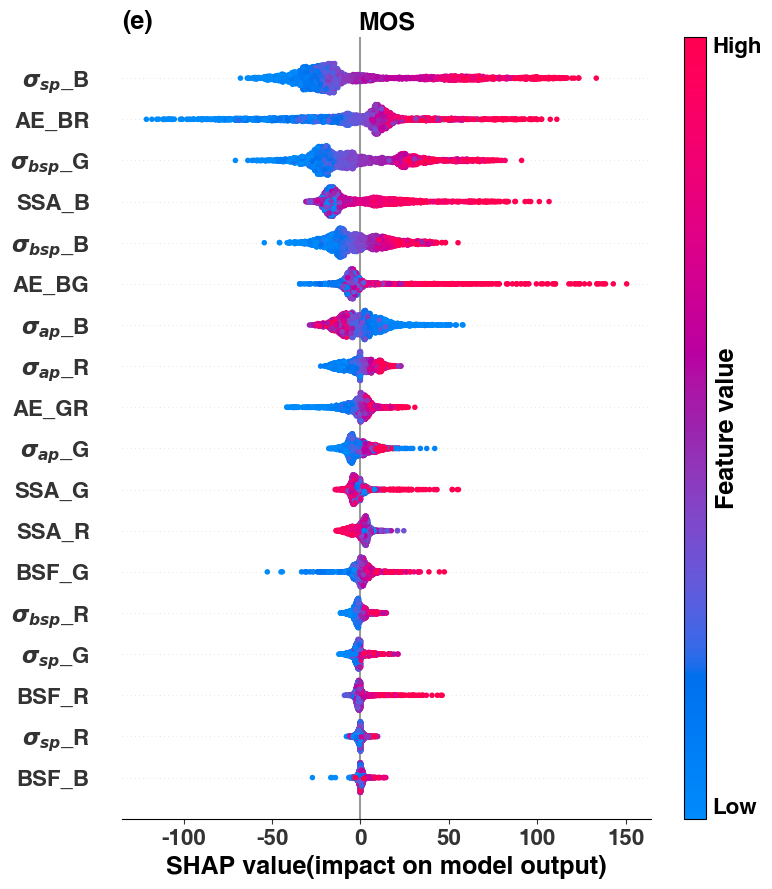

In [259]:


import os
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'
shap.summary_plot(
    shap_values_mos,
    selected_X_test,
    feature_names=feature_names,
    show=False,
    color_bar=False
)
# shap.summary_plot(shap_values_mos, selected_X_test, show=False,color_bar=False)
cbar = plt.colorbar(aspect=35)
cbar.set_label('Feature value',size=18,fontname='Helvetica', fontweight='bold')
cbar.ax.set_yticklabels([])
cbar.ax.tick_params(axis='y', which='both', length=0)
cbar.ax.text(1.3,0,'Low',va='bottom',ha='left',transform=cbar.ax.transAxes,fontsize=16)
cbar.ax.text(1.3,1,'High',va='top',ha='left',transform=cbar.ax.transAxes,fontsize=16)

plt.xlabel('SHAP value(impact on model output)',fontsize=18,fontname='Helvetica', fontweight='bold')
plt.tick_params(axis='x',labelsize=16)
plt.tick_params(axis='y',labelsize=16)
plt.title('(e)', loc='left', fontsize=18, fontname='Helvetica', fontweight='bold')
plt.title('MOS', fontsize=18, fontname='Helvetica', fontweight='bold')
# plt.savefig('E:/aabc/summary/fig-250329/shap-mos.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


## inter

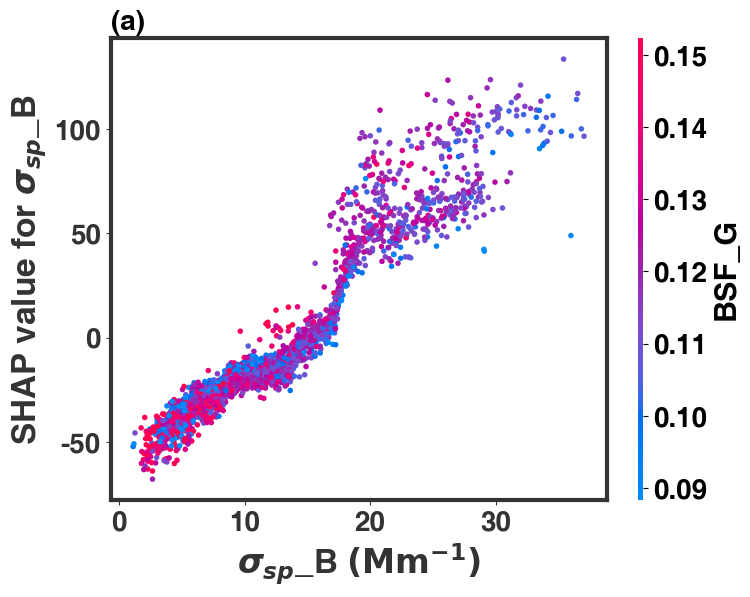

In [307]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_mos, selected_X_test, interaction_index='BSF_G', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(a)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/mos11.png',dpi=300,bbox_inches='tight',pad_inches=0)

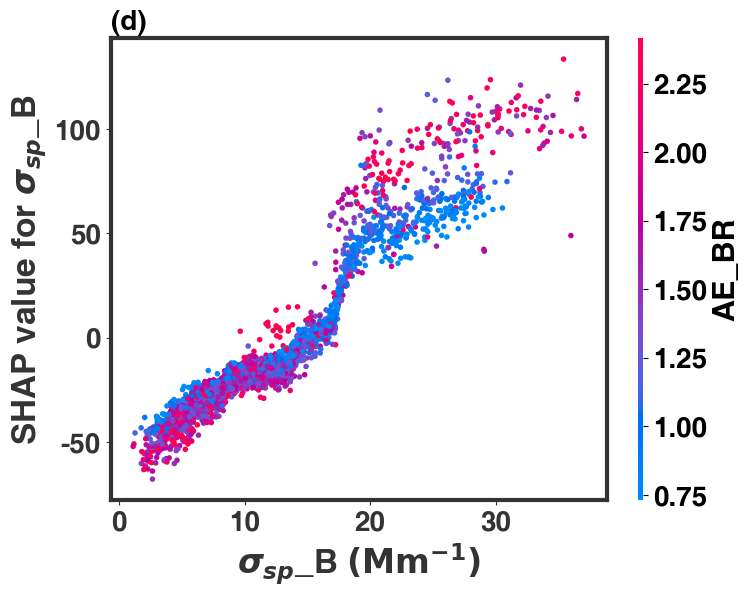

In [261]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_mos, selected_X_test, interaction_index='AE_BR', ax=ax, show=False)
# dependence

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(d)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/mos1.png',dpi=300,bbox_inches='tight',pad_inches=0)

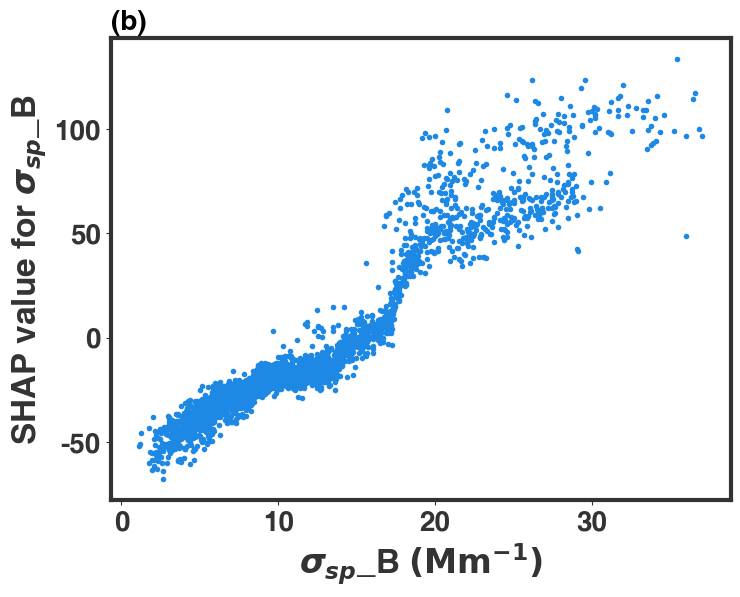

In [263]:
fig, ax = plt.subplots(figsize=(8, 6))
shap.dependence_plot('BS_B', shap_values_mos, selected_X_test, interaction_index=None, ax=ax, show=False)
# dependence

# cbar = ax.collections[0].colorbar
# cbar.ax.tick_params(labelsize=20) 
# cbar.set_label('AE_BG', fontsize=24)
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_title('(b)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/mos22.png',dpi=300,bbox_inches='tight',pad_inches=0)

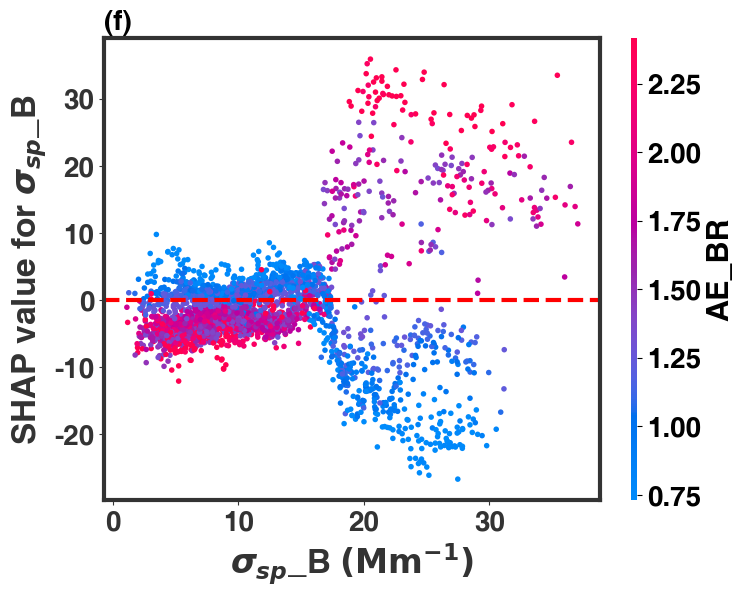

In [264]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_mos[:, :, selected_X_test.columns.get_loc("AE_BR")],  
    selected_X_test,
    interaction_index="AE_BR",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('AE_BR', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
# ax.set_title('(f)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(f)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/mos33.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


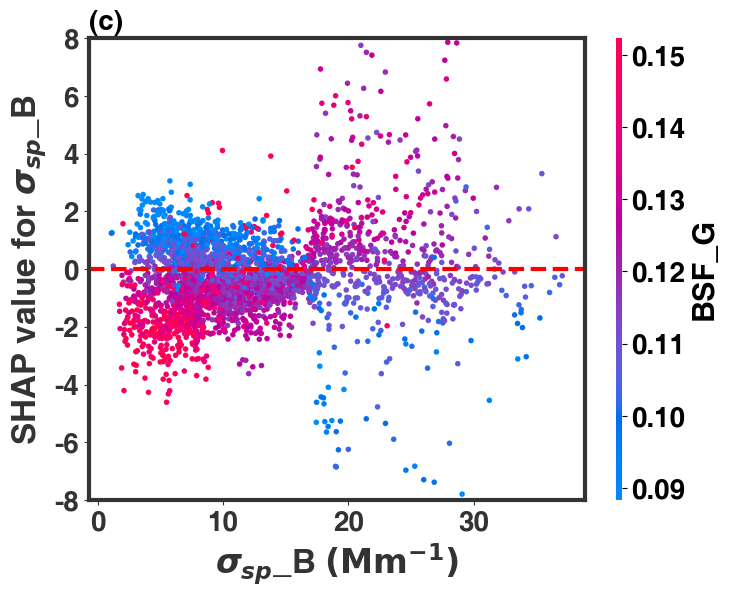

In [308]:
fig, ax = plt.subplots(figsize=(8, 6))
# interaction
shap.dependence_plot(
    "BS_B",  # key feature
    shap_interaction_values_mos[:, :, selected_X_test.columns.get_loc("BSF_G")],  
    selected_X_test,
    interaction_index="BSF_G",  # interactive feature
    ax=ax,
    show=False
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20) 
cbar.set_label('BSF_G', fontsize=22, fontweight='bold') 
ax.set_xlabel('$\sigma_{sp}$_B $(\mathrm{Mm}^{-1})$', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.set_ylabel('SHAP value for $\sigma_{sp}$_B', fontsize=24, fontname='Helvetica', fontweight='bold')
ax.spines['bottom'].set_linewidth(3)  
ax.spines['top'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['right'].set_linewidth(3) 
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
formatter = FuncFormatter(lambda x, pos: f'{x:.2f}')
cbar.ax.yaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_ylim(-8,8)
# ax.set_title('(e)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
ax.axhline(0, color='red', linestyle='--', linewidth=3)
ax.set_title('(c)', loc='left', fontsize=20, fontname='Helvetica', fontweight='bold')
plt.savefig('E:/aabc/summary/fig-250416/mos3.png',dpi=300,bbox_inches='tight',pad_inches=0)
plt.show()


FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator


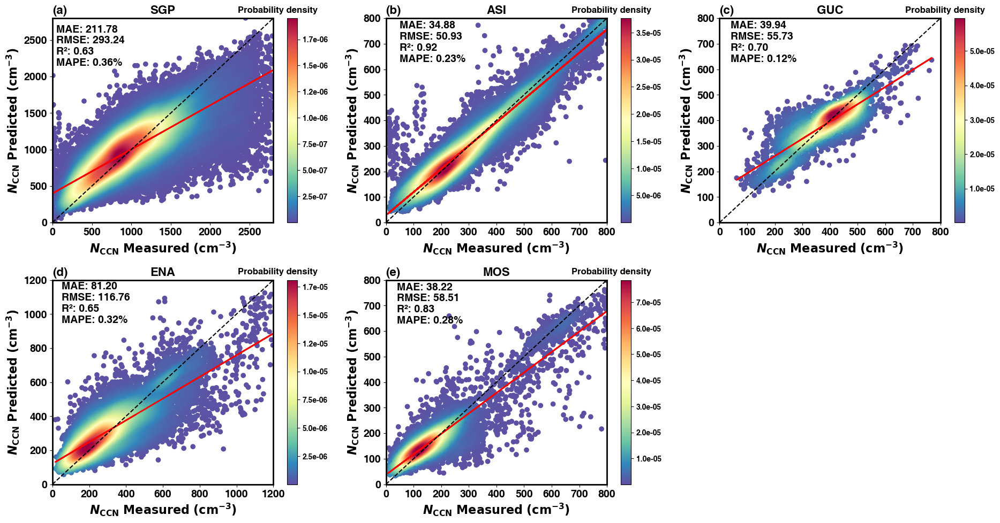

In [168]:
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams['font.weight'] = 'bold'


def density_scatter(x, y, ax=None, is_cbar=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(x, y, c=z, cmap='Spectral_r')

    if is_cbar:
        norm = Normalize(vmin=np.min(z), vmax=np.max(z))
        cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap='Spectral_r'), ax=ax)
        cbar.ax.tick_params(labelsize=10)  
        cbar.ax.set_yticklabels(['{:.1e}'.format(t) for t in cbar.get_ticks()], fontname='Helvetica') 
        ax.text(1.02, 1.02, 'Probability density', transform=ax.transAxes, fontsize=12, fontname='Helvetica', fontweight='bold', ha='center', va='bottom', rotation=0)
    return ax


# 创建一个包含2行2列的子图布局
fig, axs = plt.subplots(2, 3, figsize=(19, 10))

# 第一张图 (SGP)
x = y_test.to_numpy()
y = predictions
ax = axs[0, 0]
density_scatter(x=x, y=y, ax=ax, is_cbar=True)
slope, intercept, r_value, p_value, std_err = linregress(x, y)
regression_line = slope * x + intercept
ax.plot(x, regression_line, 'red', lw=2)
ax.plot([0, 2800], [0, 2800], 'black', lw=1.5, linestyle='--')  # 1:1
ax.axis([0, 2800, 0, 2800])
ax.tick_params(axis='both', labelsize=14)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(500))
ax.yaxis.set_major_locator(MultipleLocator(500))
ax.set_xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('(a)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('SGP', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
BIAS_sgp = mean(x - y)
MSE_sgp = mean_squared_error(x, y)
RMSE_sgp = np.power(MSE_sgp, 0.5)
R2_sgp = r2_score(x, y)
MAE_sgp = mean_absolute_error(x, y)
MAPE_sgp = mean_absolute_percentage_error(x, y)
text_sgp = f'\nMAE: {MAE_sgp:.2f}\nRMSE: {RMSE_sgp:.2f}\nR²: {R2_sgp:.2f}\nMAPE: {MAPE_sgp:.2f}%'
ax.text(50, 2150, text_sgp, fontsize=14)

# 第二张图 (ENA)
x = y_test_ena.to_numpy()
y = predictions_ena
ax = axs[1, 0]
density_scatter(x=x, y=y, ax=ax, is_cbar=True)
slope, intercept, r_value, p_value, std_err = linregress(x, y)
regression_line = slope * x + intercept
ax.plot(x, regression_line, 'red', lw=2)
ax.plot([0, 1200], [0, 1200], 'black', lw=1.5, linestyle='--')  # 1:1
ax.axis([0, 1200, 0, 1200])
ax.tick_params(axis='both', labelsize=14)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(200))
ax.yaxis.set_major_locator(MultipleLocator(200))
ax.set_xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('(d)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('ENA', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
BIAS_ena = mean(x - y)
MSE_ena = mean_squared_error(x, y)
RMSE_ena = np.power(MSE_ena, 0.5)
R2_ena = r2_score(x, y)
MAE_ena = mean_absolute_error(x, y)
MAPE_ena = mean_absolute_percentage_error(x, y)
text_ena = f'\nMAE: {MAE_ena:.2f}\nRMSE: {RMSE_ena:.2f}\nR²: {R2_ena:.2f}\nMAPE: {MAPE_ena:.2f}%'
ax.text(50, 950, text_ena, fontsize=14)

# 第三张图 (ASI)
x = y_test_asi.to_numpy()
y = predictions_asi
ax = axs[0, 1]
density_scatter(x=x, y=y, ax=ax, is_cbar=True)
slope, intercept, r_value, p_value, std_err = linregress(x, y)
regression_line = slope * x + intercept
ax.plot(x, regression_line, 'red', lw=2)
ax.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
ax.axis([0, 800, 0, 800])
ax.tick_params(axis='both', labelsize=14)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.set_xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('(b)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('ASI', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
BIAS_asi = mean(x - y)
MSE_asi = mean_squared_error(x, y)
RMSE_asi = np.power(MSE_asi, 0.5)
R2_asi = r2_score(x, y)
MAE_asi = mean_absolute_error(x, y)
MAPE_asi = mean_absolute_percentage_error(x, y)
text_asi = f'\nMAE: {MAE_asi:.2f}\nRMSE: {RMSE_asi:.2f}\nR²: {R2_asi:.2f}\nMAPE: {MAPE_asi:.2f}%'
ax.text(50, 630, text_asi, fontsize=14)

# 第四张图 (GUC)
x = y_test_guc.to_numpy()
y = predictions_guc
ax = axs[0, 2]
density_scatter(x=x, y=y, ax=ax, is_cbar=True)
slope, intercept, r_value, p_value, std_err = linregress(x, y)
regression_line = slope * x + intercept
ax.plot(x, regression_line, 'red', lw=2)
ax.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
ax.axis([0, 800, 0, 800])
ax.tick_params(axis='both', labelsize=14)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.set_xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('(c)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('GUC', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
BIAS_guc = mean(x - y)
MSE_guc = mean_squared_error(x, y)
RMSE_guc = np.power(MSE_guc, 0.5)
R2_guc = r2_score(x, y)
MAE_guc = mean_absolute_error(x, y)
MAPE_guc = mean_absolute_percentage_error(x, y)
text_guc = f'\nMAE: {MAE_guc:.2f}\nRMSE: {RMSE_guc:.2f}\nR²: {R2_guc:.2f}\nMAPE: {MAPE_guc:.2f}%'
ax.text(40, 630, text_guc, fontsize=14)

# 第四张图 (MOS)
x = y_test_mos.to_numpy()
y = predictions_mos
ax = axs[1, 1]
density_scatter(x=x, y=y, ax=ax, is_cbar=True)
slope, intercept, r_value, p_value, std_err = linregress(x, y)
regression_line = slope * x + intercept
ax.plot(x, regression_line, 'red', lw=2)
ax.plot([0, 800], [0, 800], 'black', lw=1.5, linestyle='--')  # 1:1
ax.axis([0, 800, 0, 800])
ax.tick_params(axis='both', labelsize=14)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.set_xlabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Measured}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('(e)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.set_title('MOS', fontsize=16,fontname='Helvetica', fontweight='bold')
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
BIAS_guc = mean(x - y)
MSE_guc = mean_squared_error(x, y)
RMSE_guc = np.power(MSE_guc, 0.5)
R2_guc = r2_score(x, y)
MAE_guc = mean_absolute_error(x, y)
MAPE_guc = mean_absolute_percentage_error(x, y)
text_guc = f'\nMAE: {MAE_guc:.2f}\nRMSE: {RMSE_guc:.2f}\nR²: {R2_guc:.2f}\nMAPE: {MAPE_guc:.2f}%'
ax.text(40, 630, text_guc, fontsize=14)

fig.delaxes(axs[-1][-1])
# 保存并显示图像
plt.tight_layout(pad=1.5)

plt.savefig('E:/aabc/summary/fig-250416/all_sites2.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.show()


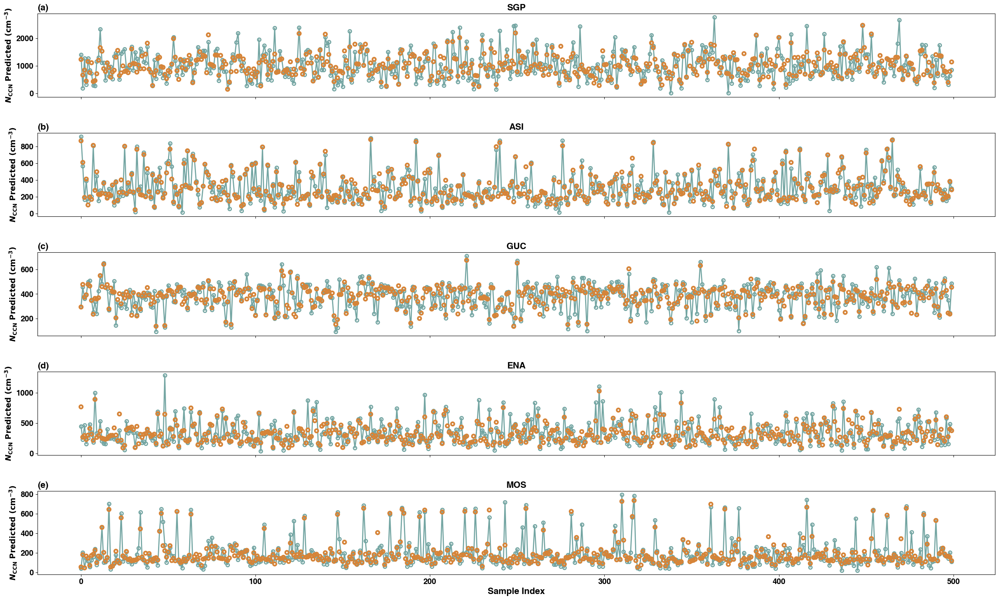

In [169]:
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = '14'
# 设置整体图形大小
fig, axs = plt.subplots(5, 1, figsize=(26, 16), sharex=True)  # 共享X轴

# SGP图
axs[0].scatter(range(len(predictions))[0:500], predictions[0:500], label='Predicted Values', marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
axs[0].plot(range(len(y_test))[0:500], y_test[0:500], color='#73a5a2', label='True Values', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2, linewidth=2, zorder=1)
axs[0].set_title('(a)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[0].set_title('SGP', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[0].set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=14, fontname='Helvetica', fontweight='bold')

# ENA图
axs[3].scatter(range(len(predictions_ena))[0:500], predictions_ena[0:500], marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
axs[3].plot(range(len(y_test_ena))[0:500], y_test_ena[0:500], color='#73a5a2', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2, linewidth=2, zorder=1)
axs[3].set_title('(d)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[3].set_title('ENA', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[3].set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=14, fontname='Helvetica', fontweight='bold')

# ASI图
axs[1].scatter(range(len(predictions_asi))[0:500], predictions_asi[0:500], marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
axs[1].plot(range(len(y_test_asi))[0:500], y_test_asi[0:500], color='#73a5a2', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2, linewidth=2, zorder=1)
axs[1].set_title('(b)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[1].set_title('ASI', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[1].set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=14, fontname='Helvetica', fontweight='bold')

# GUC图
axs[2].scatter(range(len(predictions_guc))[0:500], predictions_guc[0:500], marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
axs[2].plot(range(len(y_test_guc))[0:500], y_test_guc[0:500], color='#73a5a2', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2, linewidth=2, zorder=1)
axs[2].set_title('(c)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[2].set_title('GUC', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[2].set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=14, fontname='Helvetica', fontweight='bold')
# axs[3].set_xlabel('Sample Index', fontsize=16, fontname='Helvetica', fontweight='bold')  # 只在最下面的图上设置X轴标签


# GUC图
axs[4].scatter(range(len(predictions_mos))[0:500], predictions_mos[0:500], marker='o', color='#d68438', s=36, facecolors='none', edgecolors='#d68438', linewidths=3, zorder=2)
axs[4].plot(range(len(y_test_mos))[0:500], y_test_mos[0:500], color='#73a5a2', marker='o', linestyle='-', markersize=6, markerfacecolor='none', markeredgewidth=2, linewidth=2, zorder=1)
axs[4].set_title('(e)', loc='left', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[4].set_title('MOS', fontsize=16,fontname='Helvetica', fontweight='bold')
axs[4].set_ylabel(r'$\mathit{N}_{\mathrm{CCN}}\ \mathrm{Predicted}\ (\mathrm{cm}^{-3})$', fontsize=14, fontname='Helvetica', fontweight='bold')
axs[4].set_xlabel('Sample Index', fontsize=16, fontname='Helvetica', fontweight='bold')  # 只在最下面的图上设置X轴标签

plt.tight_layout(pad=3.0)
plt.savefig('E:/aabc/summary/fig-250416/combined-line.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.show()
